# Deploying drones for fire services in Greater London: using P-median and MCLP
## CASA0004/0010：Dissertation 22/23
*Author: Shiding Zhang*<br>
*Time: 05/2023-08/2023*
***
#### About this document
- *The **data** I used comes from [London data](https://data.london.gov.uk/dataset/london-fire-brigade-incident-records), [Fire station](https://github.com/theodi/FNR_Analysis/blob/master/data/preprocessed/stations.csv), [Hospital locations](https://www.kaggle.com/datasets/treich/hospital-locations-in-england?resource=download&select=hopsital_locations_england.csv), [Police stations](https://www.met.police.uk/foi-ai/metropolitan-police/disclosure-2020/october/list-of-mps-police-stations/) and [statistical gis boundaries london.](https://data.london.gov.uk/dataset/statistical-gis-boundary-files-london)*   
- *The code to use the method is from [the P-Median problem](https://github.com/pysal/spopt/blob/main/notebooks/p-median.ipynb) and [the maximal coverage location problem.](https://github.com/pysal/spopt/blob/main/notebooks/mclp.ipynb)*
- *I have uploaded the **raw data** and the **source code** for this assignment to Github, which you can find [Github.](https://github.com/ucfnsz3/Dissertation)*
***

# **The P-Median Problem**

In [1]:
# import package
import geopandas as gpd
import numpy as np
import pandas as pd
import datetime
import time
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
%matplotlib inline 
# read .zip
import geopandas as gpd
import urllib.request
import zipfile

In [ ]:
### load london fire brigade incident records dataset
#incident = pd.read_excel('https://data.london.gov.uk/download/london-fire-brigade-incident-records/f5066d66-c7a3-415f-9629-026fbda61822/LFB%20Incident%20data%20Last%203%20years.xlsx')
#incident.head()

In [2]:
# load london fire brigade incident records dataset
incident = pd.read_csv('https://raw.githubusercontent.com/ucfnsz3/Dissertation/main/LFB%20Incident%20data_2023.csv')
incident.head()

,IncidentNumber,DateOfCall,CalYear,TimeOfCall,HourOfCall,IncidentGroup,StopCodeDescription,SpecialServiceType,PropertyCategory,PropertyType,...,FirstPumpArriving_AttendanceTime,FirstPumpArriving_DeployedFromStation,SecondPumpArriving_AttendanceTime,SecondPumpArriving_DeployedFromStation,NumStationsWithPumpsAttending,NumPumpsAttending,PumpCount,PumpHoursRoundUp,Notional Cost (£),NumCalls
0,000001-01012023,44927,2023,0.000313,0,Fire,Primary Fire,NaN,Road Vehicle,Towing caravan (not on tow or on site),...,378.0,Heston,509.0,Heston,3.0,4.0,4.0,3.0,1092.0,4
1,000002-01012023,44927,2023,0.002060,0,False Alarm,AFA,NaN,Non Residential,Pub/wine bar/bar,...,207.0,Wandsworth,NaN,NaN,1.0,1.0,1.0,1.0,364.0,1
2,000003-01012023,44927,2023,0.002095,0,False Alarm,False alarm - Good intent,NaN,Dwelling,House - single occupancy,...,424.0,Tooting,479.0,Tooting,1.0,2.0,2.0,1.0,364.0,1
3,000004-01012023,44927,2023,0.002998,0,Fire,Secondary Fire,NaN,Outdoor,Tree scrub,...,295.0,Richmond,NaN,NaN,1.0,1.0,1.0,1.0,364.0,2
4,000005-01012023,44927,2023,0.003056,0,Special Service,Special Service,Lift Release,Dwelling,Purpose Built Flats/Maisonettes - 10 or more s...,...,251.0,Brixton,NaN,NaN,1.0,1.0,1.0,2.0,728.0,1


In [27]:
# convert the dataset into csv file
#incident.to_csv(r'london-fire-brigade-incident-records.csv',index=None,header = True)

In [3]:
# delete the NaN or Null rows for vaccination
incident.dropna(inplace = True)
incident.sample(10)

,IncidentNumber,DateOfCall,CalYear,TimeOfCall,HourOfCall,IncidentGroup,StopCodeDescription,SpecialServiceType,PropertyCategory,PropertyType,...,FirstPumpArriving_AttendanceTime,FirstPumpArriving_DeployedFromStation,SecondPumpArriving_AttendanceTime,SecondPumpArriving_DeployedFromStation,NumStationsWithPumpsAttending,NumPumpsAttending,PumpCount,PumpHoursRoundUp,Notional Cost (£),NumCalls
7754,012148-25012023,44951,2023,0.385370,9,Special Service,Special Service,Assist other agencies,Road Vehicle,Lorry/HGV,...,831.0,Plaistow,864.0,East Ham,2.0,2.0,2.0,1.0,364.0,1
2689,004172-09012023,44935,2023,0.848808,20,Special Service,Special Service,RTC,Road Vehicle,Multiple Vehicles,...,236.0,Harold Hill,281.0,Romford,2.0,2.0,2.0,1.0,364.0,2
674,001080-02012023,44928,2023,0.929132,22,Special Service,Special Service,Medical Incident,Non Residential,Fire station,...,13.0,Brixton,14.0,Brixton,1.0,2.0,2.0,2.0,728.0,1
5783,009077-19012023,44945,2023,0.813495,19,Special Service,Special Service,RTC,Road Vehicle,Multiple Vehicles,...,389.0,Enfield,450.0,Enfield,1.0,2.0,2.0,2.0,728.0,2
6301,009940-21012023,44947,2023,0.452002,10,Special Service,Special Service,Suicide/attempts,Boat,Barge,...,402.0,Homerton,475.0,Leyton,2.0,2.0,2.0,1.0,364.0,1
2949,004542-10012023,44936,2023,0.685382,16,Special Service,Special Service,Flooding,Boat,Other vessel,...,270.0,Lambeth,270.0,Lambeth,4.0,6.0,7.0,8.0,2912.0,2
1720,002684-06012023,44932,2023,0.647755,15,Special Service,Special Service,Other rescue/release of persons,Non Residential,Restaurant/cafe,...,318.0,Euston,479.0,Dowgate,2.0,2.0,2.0,2.0,728.0,2
612,000997-02012023,44928,2023,0.773391,18,Special Service,Special Service,RTC,Road Vehicle,Car,...,306.0,Eltham,324.0,Sidcup,2.0,2.0,2.0,1.0,364.0,1
5298,008301-18012023,44944,2023,0.544641,13,Special Service,Special Service,RTC,Road Vehicle,Car,...,338.0,East Greenwich,437.0,Plumstead,2.0,2.0,2.0,3.0,1092.0,1
2056,003204-07012023,44933,2023,0.731354,17,Special Service,Special Service,Assist other agencies,Outdoor,Beach,...,297.0,Lambeth,311.0,Lambeth,5.0,6.0,6.0,2.0,728.0,1


In [29]:
incident.shape

(198, 39)

In [30]:
# define function to print all column names
def columns(df):
    for c in df.columns:
        print (c)

In [31]:
columns(incident)

IncidentNumber
DateOfCall
CalYear
TimeOfCall
HourOfCall
IncidentGroup
StopCodeDescription
SpecialServiceType
PropertyCategory
PropertyType
AddressQualifier
Postcode_full
Postcode_district
UPRN
USRN
IncGeo_BoroughCode
IncGeo_BoroughName
ProperCase
IncGeo_WardCode
IncGeo_WardName
IncGeo_WardNameNew
Easting_m
Northing_m
Easting_rounded
Northing_rounded
Latitude
Longitude
FRS
IncidentStationGround
FirstPumpArriving_AttendanceTime
FirstPumpArriving_DeployedFromStation
SecondPumpArriving_AttendanceTime
SecondPumpArriving_DeployedFromStation
NumStationsWithPumpsAttending
NumPumpsAttending
PumpCount
PumpHoursRoundUp
Notional Cost (£)
NumCalls


In [32]:
incident.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 198 entries, 7 to 9861
Data columns (total 39 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   IncidentNumber                          198 non-null    object 
 1   DateOfCall                              198 non-null    int64  
 2   CalYear                                 198 non-null    int64  
 3   TimeOfCall                              198 non-null    float64
 4   HourOfCall                              198 non-null    int64  
 5   IncidentGroup                           198 non-null    object 
 6   StopCodeDescription                     198 non-null    object 
 7   SpecialServiceType                      198 non-null    object 
 8   PropertyCategory                        198 non-null    object 
 9   PropertyType                            198 non-null    object 
 10  AddressQualifier                        198 non-null    objec

In [8]:
# load fire station dataset
station = pd.read_csv('https://raw.githubusercontent.com/ucfnsz3/Dissertation/main/data/fire%20stations.csv')

In [9]:
# delete the NaN or Null rows for vaccination
station.dropna(inplace = True)
station.sample(10)

,Name,Address,Borough,Latitude,Longitude,Type
59,Lee Green,"9 Eltham Road, London, Greater London SE12 8ES...",Greenwich,51.456125,0.012794,fire station
50,Ilford,"460 High Road, Ilford, Greater London IG1 1UE, UK",Redbridge,51.562347,0.089938,fire station
57,Lambeth,"8 Albert Embankment, London Borough of Lambeth...",Lambeth,51.492536,-0.121537,fire station
20,Deptford,"186 Evelyn Street, London, Greater London SE8, UK",Lewisham,51.485013,-0.033733,fire station
32,Feltham,"101 Fagg's Road, Feltham, Greater London TW14 ...",Hounslow&nbsp;,51.461027,-0.413645,fire station
67,New Malden,"180 Burlington Road, New Malden, Greater Londo...",Merton,51.399452,-0.244330,fire station
101,Wandsworth,"45 West Hill, London, Greater London SW18, UK",Wandsworth,51.456310,-0.203728,fire station
41,Hayes,"65 Shepiston Lane, Hayes, Greater London UB3 1...",Hillingdon&nbsp;,51.495824,-0.431196,fire station
19,Dagenham,"Rainham Road North, Dagenham, Greater London R...",Barking and Dagenham,51.558785,0.157054,fire station
112,Woolwich,"24 Sunbury Street, London, Greater London SE18...",Greenwich,51.492115,0.057651,fire station


In [11]:
# check the shape of the data
station.shape

(113, 6)

In [12]:
columns(station)

Name
Address
Borough
Latitude
Longitude
Type


In [12]:
# load potential base stations dataset
potential_station = pd.read_csv('https://raw.githubusercontent.com/ucfnsz3/Dissertation/main/potential%20base%20stations.csv')

In [4]:
# load potential base stations dataset
potential_station = pd.read_csv('https://raw.githubusercontent.com/ucfnsz3/Dissertation/main/potential%20base%20stations_edit.csv')

In [34]:
columns(potential_station)

Name
Latitude
Longitude
Type


In [35]:
potential_station.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 290 entries, 0 to 289
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Name       290 non-null    object 
 1   Latitude   290 non-null    float64
 2   Longitude  290 non-null    object 
 3   Type       290 non-null    object 
dtypes: float64(1), object(3)
memory usage: 9.2+ KB


In [36]:
potential_station.shape

(290, 4)

In [37]:
# load the London Borough
# URL of the ZIP file
url = 'https://github.com/ucfnsz3/Dissertation/raw/main/data/London_Borough.zip'

# Download the ZIP file
urllib.request.urlretrieve(url, 'London_Borough.zip')

# Extract the shapefile from the ZIP file
with zipfile.ZipFile('London_Borough.zip', 'r') as zip_ref:
    zip_ref.extractall()

# Read the extracted shapefile using GeoPandas
borough = gpd.read_file('London_Borough/London_Borough_Excluding_MHW.shp')

# Print information about the GeoDataFrame
borough.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   NAME        33 non-null     object  
 1   GSS_CODE    33 non-null     object  
 2   HECTARES    33 non-null     float64 
 3   NONLD_AREA  33 non-null     float64 
 4   ONS_INNER   33 non-null     object  
 5   SUB_2009    0 non-null      object  
 6   SUB_2006    0 non-null      object  
 7   geometry    33 non-null     geometry
dtypes: float64(2), geometry(1), object(5)
memory usage: 2.2+ KB


In [38]:
import folium
import geopandas as gpd
import pandas as pd

# Create a map centered around Greater London
m = folium.Map(location=[51.5074, -0.1278], zoom_start=10, control_scale=True)

# Create a GeoDataFrame from the incident data
#geometry = gpd.points_from_xy(incident['Longitude'], incident['Latitude'])
#incident_gdf = gpd.GeoDataFrame(incident, geometry=geometry)

# Create a GeoDataFrame from the fire station data
station_geometry = gpd.points_from_xy(station['Longitude'], station['Latitude'])
station_gdf = gpd.GeoDataFrame(station, geometry=station_geometry)

# Add incident locations to the map
#for idx, row in incident_gdf.iterrows():
    #folium.Marker([row['Latitude'], row['Longitude']], popup=row['PropertyCategory'], icon=folium.Icon(color='red', icon='fire')).add_to(m)

# Add fire station locations to the map
for idx, row in station_gdf.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']], popup=row['Name'], icon=folium.Icon(color='blue', icon='info-sign')).add_to(m)

# Add district boundaries to the map
folium.GeoJson(borough, name='District Boundaries').add_to(m)

# Add layer control to the map
folium.LayerControl(position='bottomleft').add_to(m)

# Display the map
m

In [39]:
import folium
import geopandas as gpd
import pandas as pd

# Create a map centered around Greater London
m = folium.Map(location=[51.5074, -0.1278], zoom_start=10, control_scale=True)

# Create a GeoDataFrame from the potential base station data
potential_station_geometry = gpd.points_from_xy(potential_station['Longitude'], potential_station['Latitude'])
potential_station_gdf = gpd.GeoDataFrame(potential_station, geometry=potential_station_geometry)

# Add potential base station locations to the map
for idx, row in potential_station_gdf.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']], popup=row['Name'], icon=folium.Icon(color='green', icon='info-sign')).add_to(m)

# Add district boundaries to the map
folium.GeoJson(borough, name='District Boundaries').add_to(m)

# Add layer control to the map
folium.LayerControl(position='bottomleft').add_to(m)

# Display the map
m

In [40]:
import folium
import geopandas as gpd
import pandas as pd

# Create a map centered around Greater London
m = folium.Map(location=[51.5074, -0.1278], zoom_start=10, control_scale=True)

# Create a GeoDataFrame from the incident data
geometry = gpd.points_from_xy(incident['Longitude'], incident['Latitude'])
incident_gdf = gpd.GeoDataFrame(incident, geometry=geometry)

# Add incident locations to the map
for idx, row in incident_gdf.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']], popup=row['PropertyCategory'], icon=folium.Icon(color='red', icon='fire')).add_to(m)

# Add district boundaries to the map
folium.GeoJson(borough, name='District Boundaries').add_to(m)

# Add layer control to the map
folium.LayerControl(position='bottomleft').add_to(m)

# Display the map
m

In [16]:
# Create a GeoDataFrame from the incident data
geometry = gpd.points_from_xy(incident['Longitude'], incident['Latitude'])
incident_gdf = gpd.GeoDataFrame(incident, geometry=geometry)

# Create a map centered around Greater London
m = folium.Map(location=[51.5074, -0.1278], zoom_start=10, control_scale=True)

# Create a GeoDataFrame from the fire station data
station_geometry = gpd.points_from_xy(station['Longitude'], station['Latitude'])
station_gdf = gpd.GeoDataFrame(station, geometry=station_geometry)

# Add incident locations to the map
for idx, row in incident_gdf.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=1,  # Adjust the size of the circle marker as desired
        color='red',  # Set the color of the circle marker
        fill=True,
        fill_color='red',  # Set the fill color of the circle marker
        fill_opacity=1,  # Adjust the opacity of the fill
        popup=row['PropertyCategory']
    ).add_to(m)

# Add district boundaries to the map
folium.GeoJson(borough, name='District Boundaries').add_to(m)

# Add layer control to the map
folium.LayerControl(position='bottomleft').add_to(m)

# Display the map
m

In [5]:
pip install watermark

Note: you may need to restart the kernel to use updated packages.


In [6]:
%config InlineBackend.figure_format = "retina"
%load_ext watermark
%watermark

Last updated: 2023-05-24T00:24:48.103704+00:00

Python implementation: CPython
Python version       : 3.10.5
IPython version      : 8.4.0

Compiler    : GCC 10.3.0
OS          : Linux
Release     : 5.10.16.3-microsoft-standard-WSL2
Machine     : x86_64
Processor   : x86_64
CPU cores   : 20
Architecture: 64bit



In [7]:
import geopandas
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import matplotlib.lines as mlines
import numpy
import pulp
import shapely
import spopt
from spopt.locate import PMedian, simulated_geo_points

import warnings
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    # ignore deprecation warning - GH pysal/spaghetti#649
    import spaghetti

%watermark -w
%watermark -iv

Watermark: 2.4.2

json      : 2.0.9
ipywidgets: 8.0.2
sys       : 3.10.5 | packaged by conda-forge | (main, Jun 14 2022, 07:04:59) [GCC 10.3.0]
pandas    : 1.4.3
geopandas : 0.11.1
shapely   : 1.8.5
numpy     : 1.23.3
matplotlib: 3.5.2
pulp      : 2.6.0
seaborn   : 0.11.2
spopt     : 0.5.0
spaghetti : 1.6.8



In [44]:
import pandas as pd
import pulp
from math import radians, sin, cos, sqrt, atan2

# Get the count of incident data points
CLIENT_COUNT = len(incident)

# Get the count of potential base station locations
FACILITY_COUNT = len(potential_station)

# Set the number of candidate facilities in the optimal solution
P_FACILITIES = 50

# Random seeds for reproducibility
CLIENT_SEED = 5
FACILITY_SEED = 6

# Set the solver
solver = pulp.COIN_CMD(msg=False, warmStart=True)

In [36]:
import pandas as pd
import pulp
from math import radians, sin, cos, sqrt, atan2

# Known information
maximum_service_time = 30  # minutes
air_speed = 51  # mph

# Earth's radius in miles (approximate)
EARTH_RADIUS = 3958.8

# Convert air speed to distance units (miles to degrees)
air_speed_degrees = air_speed * maximum_service_time / 60 / EARTH_RADIUS

# Set the SERVICE_RADIUS based on the maximum distance the drones can travel
SERVICE_RADIUS = air_speed_degrees

# Get the count of incident data points
CLIENT_COUNT = len(incident)

# Get the count of potential base station locations
FACILITY_COUNT = len(potential_station)

# Set the number of candidate facilities in the optimal solution
P_FACILITIES = 50

# Random seeds for reproducibility
CLIENT_SEED = 5
FACILITY_SEED = 6

# Set the solver
solver = pulp.COIN_CMD(msg=False, warmStart=True)

# Convert incident and potential station coordinates to radians
incident['Latitude_rad'] = incident['Latitude'].apply(radians)
incident['Longitude_rad'] = incident['Longitude'].apply(radians)
potential_station['Latitude_rad'] = potential_station['Latitude'].apply(radians)
potential_station['Longitude_rad'] = potential_station['Longitude'].apply(radians)

## Lattice 10x10
Create a 10x10 lattice with 9 interior lines, both vertical and horizontal.

In [45]:
# Create a 10x10 lattice with 9 interior lines, both vertical and horizontal
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    # ignore deprecation warning - GH pysal/libpysal#468
    lattice = spaghetti.regular_lattice((0, 0, 10, 10), 9, exterior=True)
ntw = spaghetti.Network(in_data=lattice)

In [46]:
streets = spaghetti.element_as_gdf(ntw, arcs=True)

**0.5个单位的缓冲区？**

In [47]:
streets_buffered = geopandas.GeoDataFrame(
    geopandas.GeoSeries(streets["geometry"].buffer(0.5).unary_union),
    crs=streets.crs,
    columns=["geometry"],
)

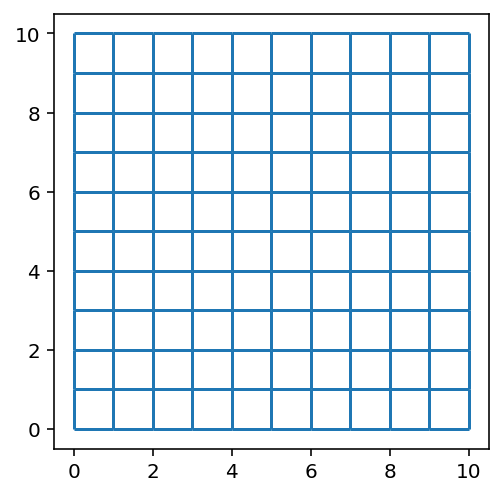

In [48]:
streets.plot();

## Simulate points in a network

In [49]:
client_points = simulated_geo_points(
    streets_buffered, needed=CLIENT_COUNT, seed=CLIENT_SEED
)
facility_points = simulated_geo_points(
    streets_buffered, needed=FACILITY_COUNT, seed=FACILITY_SEED
)

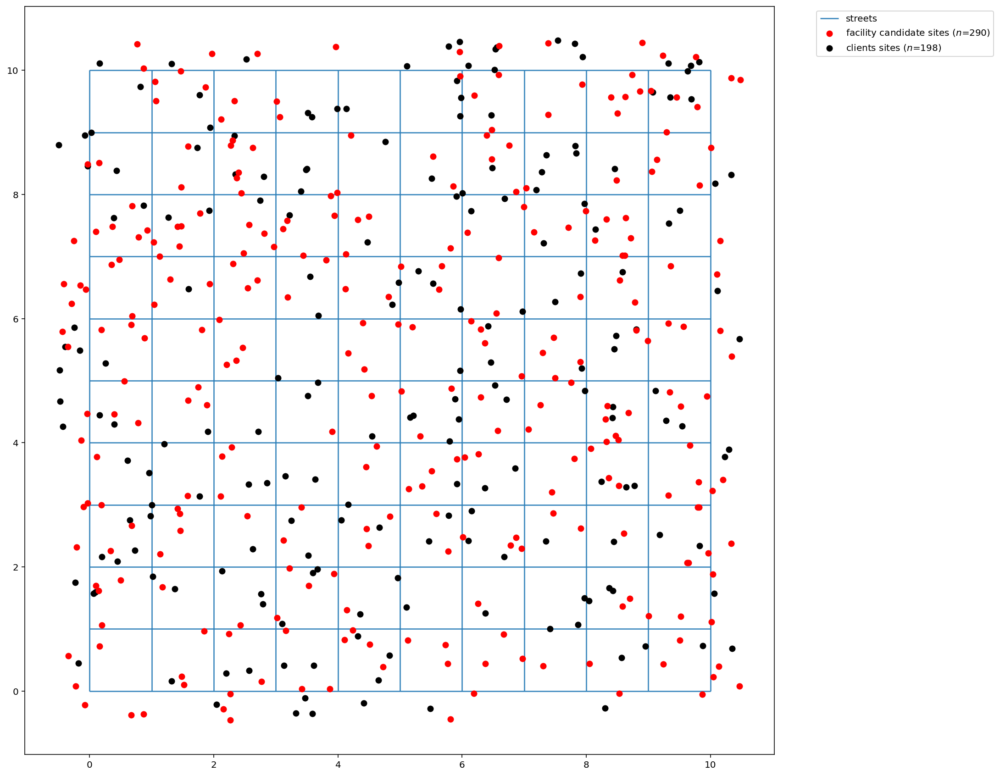

In [50]:
fig, ax = plt.subplots(figsize=(15, 15))
streets.plot(ax=ax, alpha=0.8, zorder=1, label="streets")
facility_points.plot(
    ax=ax, color="red", zorder=2, label=f"facility candidate sites ($n$={FACILITY_COUNT})"
)
client_points.plot(ax=ax, color="black", label=f"clients sites ($n$={CLIENT_COUNT})")
plt.legend(loc="upper left", bbox_to_anchor=(1.05, 1));

**1-12的随机整数，随机分配权重？**

In [51]:
numpy.random.seed(0)
ai = numpy.random.randint(1, 12, CLIENT_COUNT)
ai

array([ 6,  1,  4,  4,  8, 10,  4,  6,  3,  5,  8,  7,  9,  9, 11,  2,  7,
        8,  8,  9,  2,  6, 10,  9, 10,  5,  4,  1,  4,  6,  1,  3,  4,  9,
        2,  4,  4,  4,  8,  1,  2, 10, 10,  1, 11,  5,  8,  4,  3,  8,  3,
        1,  1,  5,  6,  6,  7,  9,  5,  2,  5, 10, 11, 11,  9,  2,  2,  8,
       10, 10,  4,  7,  8,  3,  1,  4,  6, 10, 11,  5,  5,  7,  5,  5,  4,
        5,  5,  9,  5,  4, 11,  8,  6,  6,  1,  2,  6, 10,  4,  1,  6,  1,
        2,  3,  5,  3,  1,  4,  3, 11,  1,  8,  6, 10,  1, 11,  3, 11,  8,
        3, 10,  3,  4,  4,  3,  4,  5,  2,  3, 10, 11,  2,  5, 11,  7,  9,
        3,  4,  1,  1,  7,  1,  7,  4, 11,  4,  9,  9,  9,  3,  4,  3,  1,
        9,  9,  4,  9, 11,  3,  9,  5,  4,  1,  5,  4,  7, 10,  9,  1,  9,
        6, 10,  1, 10,  7,  6,  4,  2,  9,  1,  5, 10,  7,  6,  8,  9,  9,
       10,  3,  9,  7,  7, 10,  2,  7,  9,  9,  4])

In [52]:
client_points["weights"] = ai
client_points["weights"].sum()

1150

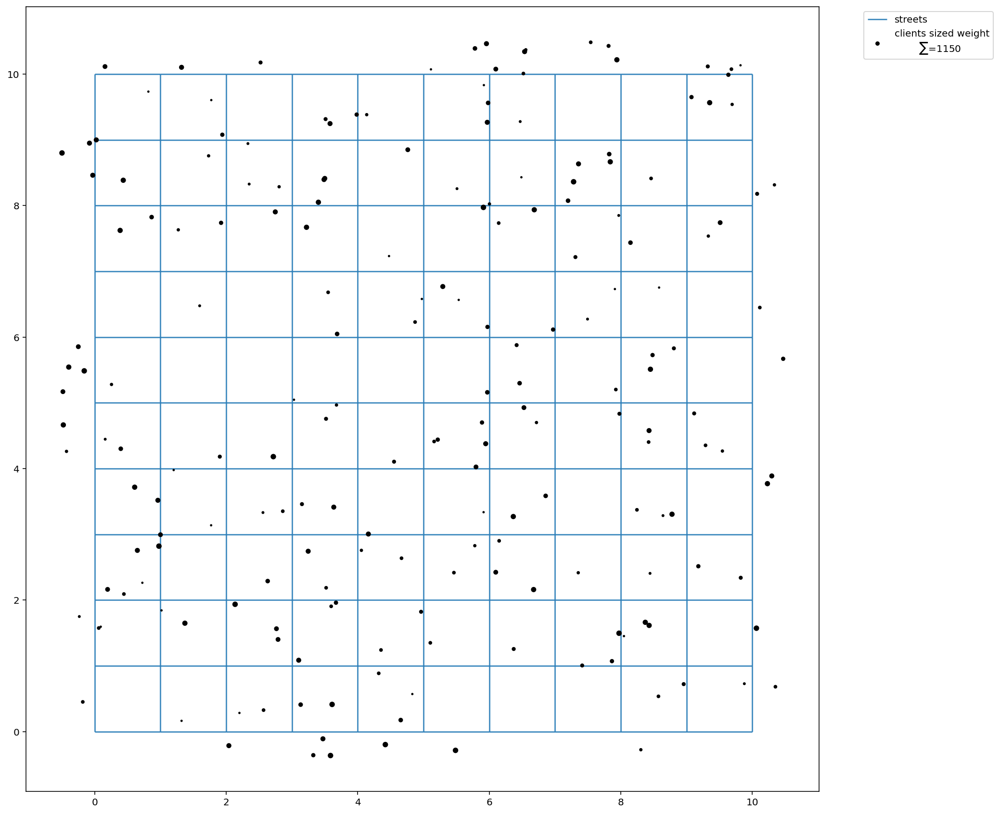

In [53]:
fig, ax = plt.subplots(figsize=(15, 15))
streets.plot(ax=ax, alpha=0.8, zorder=1, label="streets")
client_points.plot(
    ax=ax,
    color="black",
    label=f"clients sized weight\n\t$\sum$={client_points['weights'].sum()}",
    markersize=ai*2
)
plt.legend(loc="upper left", bbox_to_anchor=(1.05, 1));

## Assign simulated points network locations

In [54]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    # ignore deprecation warning - GH pysal/libpysal#468
    ntw.snapobservations(client_points, "clients", attribute=True)
clients_snapped = spaghetti.element_as_gdf(ntw, pp_name="clients", snapped=True)
# 删除不必要的列（"id "和 "comp_label"）
clients_snapped.drop(columns=["id", "comp_label"], inplace=True)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    # ignore deprecation warning - GH pysal/libpysal#468
    ntw.snapobservations(facility_points, "facilities", attribute=True)
facilities_snapped = spaghetti.element_as_gdf(ntw, pp_name="facilities", snapped=True)
facilities_snapped.drop(columns=["id", "comp_label"], inplace=True)

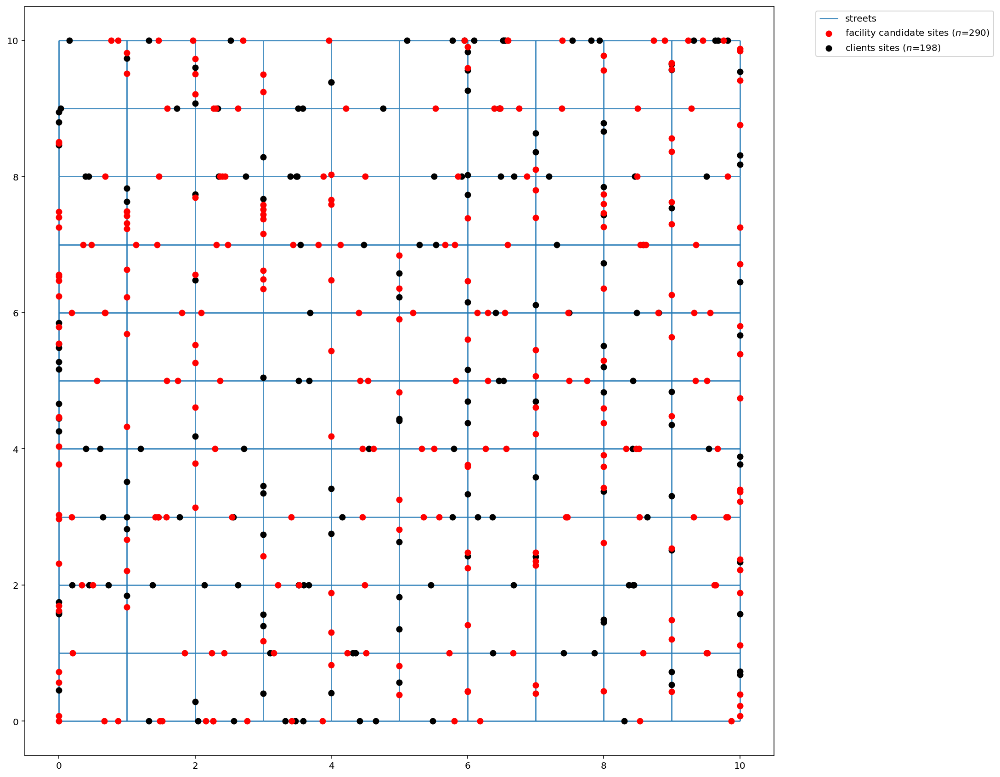

In [55]:
fig, ax = plt.subplots(figsize=(15, 15))
streets.plot(ax=ax, alpha=0.8, zorder=1, label="streets")
facilities_snapped.plot(
    ax=ax, color="red", zorder=2, label=f"facility candidate sites ($n$={FACILITY_COUNT})"
)
clients_snapped.plot(ax=ax, color="black", label=f"clients sites ($n$={CLIENT_COUNT})")
plt.legend(loc="upper left", bbox_to_anchor=(1.05, 1));

## Calculating the (network distance) cost matrix

In [56]:
cost_matrix = ntw.allneighbordistances(
    sourcepattern=ntw.pointpatterns["clients"],
    destpattern=ntw.pointpatterns["facilities"],
)
cost_matrix.shape

(198, 290)

In [57]:
cost_matrix[:5,:]

array([[13.39951703, 15.61157572,  4.39383189, ...,  5.97608145,
         1.45685353,  2.63157224],
       [13.92618165, 16.13824034,  4.92049651, ...,  6.50274607,
         0.93018891,  3.15823686],
       [ 7.55064416,  9.76270285,  4.54495901, ...,  3.87279143,
         7.30572641,  4.32433438],
       [ 3.52405953,  5.73611822,  8.11317865, ...,  3.89937605,
        11.33231103,  8.350919  ],
       [ 7.75652815,  7.09845387,  6.75084301, ..., 10.53704041,
         9.96997538,  6.98858335]])

In [58]:
cost_matrix[-5:,:]

array([[ 0.67949556,  3.82451354, 10.95774263, ...,  6.74394003,
        14.17687501, 11.19548297],
       [ 8.63401404, 10.84607272,  3.00322415, ...,  5.41452629,
         6.22235653,  3.2409645 ],
       [14.78321971, 16.9952784 ,  3.14598153, ...,  7.56373197,
         3.00333305,  2.90824118],
       [ 4.7000136 ,  6.91207229,  6.93722458, ...,  4.72342198,
        10.15635696,  7.17496493],
       [ 9.80197805, 12.01403673,  9.83526014, ...,  2.37854246,
         5.05439252,  8.07300049]])

In [38]:
# Filter the cost matrix to consider only distances within the maximum flight distance
max_flight_distance = 25.5  # Maximum flight distance in kilometers
cost_matrix[cost_matrix > max_flight_distance] = np.inf

### **注意，这部分代码先不运行，尝试加距离约束进去！**

这部分无人机参数后期将会进行更新为34.5英里/小时*38分钟，这里的数值差距不大，具有参考意义

**Haversine公式被用来计算地球表面上两点之间的大圆距离。这个公式考虑到了地球的曲率，并对两个经纬度坐标之间的距离提供了一个更准确的表示，为了确保一致性，距离约束使用一样的计算方法。但是尝试以后，代码出现了无法运行的错误，但是如果只是简单考虑距离的限制=速度*时间的话，就没有出现如下的问题？？？**

In [49]:
# Known information
maximum_service_time = 30  # minutes
air_speed = 51  # mph

# Earth's radius in miles (approximate)
EARTH_RADIUS = 3958.8

# Convert air speed to distance units (miles to degrees)
air_speed_degrees = air_speed * maximum_service_time / 60 / EARTH_RADIUS

# Set the SERVICE_RADIUS based on the maximum distance the drones can travel
SERVICE_RADIUS = air_speed_degrees

# Filter the cost matrix to consider only distances within the maximum flight distance
max_flight_distance = SERVICE_RADIUS  # Maximum flight distance in degrees
cost_matrix[cost_matrix > max_flight_distance] = np.inf

In [63]:
pmedian_from_cm = PMedian.from_cost_matrix(
    cost_matrix,
    ai,
    p_facilities=P_FACILITIES,
    name="p-median-network-distance"
)

/opt/conda/lib/python3.10/site-packages/spopt/locate/p_median.py:71: RuntimeWarning: invalid value encountered in multiply
  self.aij[i][j] * cli_assgn_vars[i][j]


**添加了距离约束以后，代码出现了以下的错误**

In [64]:
pmedian_from_cm = pmedian_from_cm.solve(solver)
pmedian_from_cm

PulpSolverError: PuLP: cannot execute glpsol

In [51]:
pmp_obj = round(pmedian_from_cm.problem.objective.value(), 3)
total_clients = len(incident)
mean_dist = pmp_obj / total_clients

print(f"A total minimized weighted distance of {pmp_obj} units is observed, "
      f"with a mean distance of {mean_dist} per individual client.")

TypeError: type NoneType doesn't define __round__ method

In [63]:
facility_points["dv"] = pmedian_from_cm.fac_vars
facility_points["dv"] = facility_points["dv"].map(lambda x: x.name.replace("_", ""))
facilities_snapped["dv"] = facility_points["dv"]
facility_points

NameError: name 'pmedian_from_cm' is not defined

### **这里是加了距离约束的代码！** 但不考虑Haversine公式

In [60]:
# Calculate the maximum drone distance based on air speed and maximum service time
max_drone_distance = 51 * (30 / 60)  # mph to miles per minute

# Calculate the distance matrix considering the drone distance constraint
drone_distance_matrix = cost_matrix.copy()
drone_distance_matrix[drone_distance_matrix > max_drone_distance] = np.inf

# Solve the p-median problem with the drone distance constraint
pmedian_with_drone = PMedian.from_cost_matrix(
    drone_distance_matrix,
    ai,
    p_facilities=P_FACILITIES,
    name="p-median-network-distance-with-drone"
)

pmedian_with_drone = pmedian_with_drone.solve(solver)
pmedian_with_drone

# Calculate the objective value and mean distance with the drone distance constraint
pmp_obj_with_drone = round(pmedian_with_drone.problem.objective.value(), 3)
total_clients = len(incident)
mean_dist_with_drone = pmp_obj_with_drone / total_clients

print(f"A total minimized weighted distance of {pmp_obj_with_drone} units is observed with the drone distance constraint, "
      f"with a mean distance of {mean_dist_with_drone} per individual client.")

A total minimized weighted distance of 562.046 units is observed with the drone distance constraint, with a mean distance of 2.838616161616162 per individual client.


In [62]:
facility_points["dv"] = pmedian_with_drone.fac_vars
facility_points["dv"] = facility_points["dv"].map(lambda x: x.name.replace("_", ""))
facilities_snapped["dv"] = facility_points["dv"]
facility_points

,geometry,dv
0,POINT (9.32146 3.15178),y0
1,POINT (8.53352 -0.04134),y1
2,POINT (0.68422 6.04557),y2
3,POINT (5.32799 4.10688),y3
4,POINT (3.18949 6.34771),y4
...,...,...
285,POINT (8.58184 1.36749),y285
286,POINT (2.40290 8.35454),y286
287,POINT (7.02996 8.10197),y287
288,POINT (1.46509 9.98749),y288


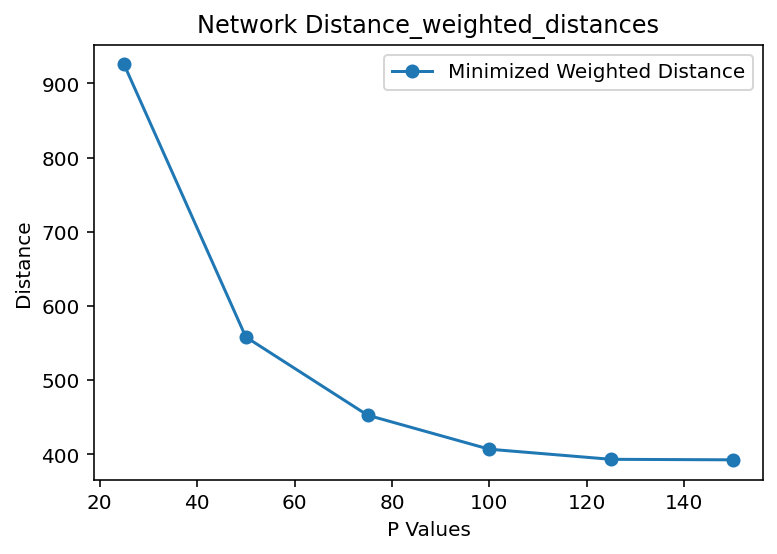

In [38]:
import matplotlib.pyplot as plt

# Data from the table
p_values = [25, 50, 75, 100, 125, 150]
min_weighted_distances = [925.381, 558.199, 452.892, 407.031, 393.437, 392.734]
#mean_distances = [4.673641414141414, 2.8191868686868684, 2.287333333333333, 2.0557121212121214, 1.9870555555555556, 1.9835050505050504]

# Plotting the line graph
plt.plot(p_values, min_weighted_distances, marker='o', label='Minimized Weighted Distance')
#plt.plot(p_values, mean_distances, marker='o', label='Mean Distance per Client')

# Labeling the axes and adding a title
plt.xlabel('P Values')
plt.ylabel('Distance')
plt.title('Network Distance_weighted_distances')

# Adding a legend
plt.legend()

# Displaying the plot
plt.show()

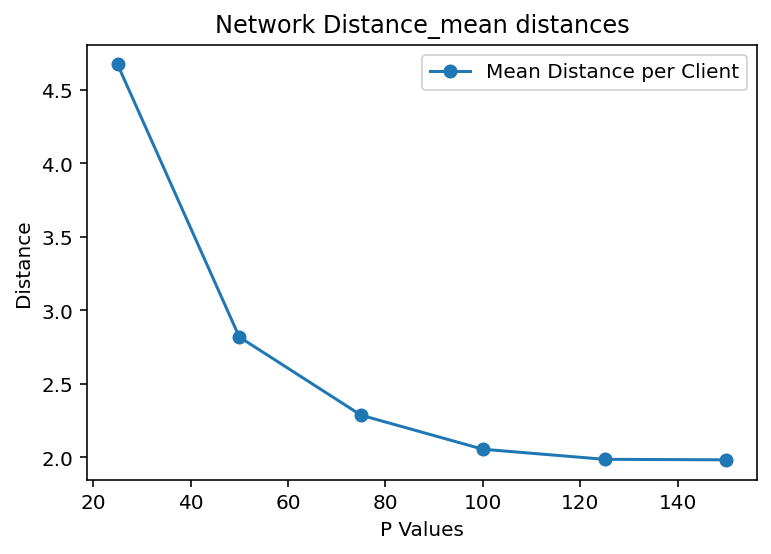

In [39]:
import matplotlib.pyplot as plt

# Data from the table
p_values = [25, 50, 75, 100, 125, 150]
#min_weighted_distances = [925.381, 558.199, 452.892, 407.031, 393.437, 392.734]
mean_distances = [4.673641414141414, 2.8191868686868684, 2.287333333333333, 2.0557121212121214, 1.9870555555555556, 1.9835050505050504]

# Plotting the line graph
#plt.plot(p_values, min_weighted_distances, marker='o', label='Minimized Weighted Distance')
plt.plot(p_values, mean_distances, marker='o', label='Mean Distance per Client')

# Labeling the axes and adding a title
plt.xlabel('P Values')
plt.ylabel('Distance')
plt.title('Network Distance_mean distances')

# Adding a legend
plt.legend()

# Displaying the plot
plt.show()

## Calculating euclidean distance from a GeoDataFrame

**已知欧氏距离是二维空间中两点之间的直线距离，是否应该用勾股定理计算的添加的距离约束，而不应该仅仅是距离*时间？**

In [129]:
from math import radians, sin, cos, sqrt

# Define the maximum flight distance of the drone (in kilometers)
MAX_FLIGHT_DISTANCE = 25.5

def calculate_distance(lat1, lon1, lat2, lon2):
    # Convert degrees to radians
    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])
    
    # Radius of the Earth in kilometers
    R = 6371.0
    
    # Calculate the differences in latitudes and longitudes
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    
    # Haversine formula to calculate distance between two points on a sphere
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * atan2(sqrt(a), sqrt(1-a))
    distance = R * c
    
    return distance

def create_distance_matrix():
    distance_matrix = []
    for i in range(CLIENT_COUNT):
        client_lat = incident.iloc[i]['Latitude']
        client_lon = incident.iloc[i]['Longitude']
        row = []
        for j in range(FACILITY_COUNT):
            facility_lat = potential_station.iloc[j]['Latitude']
            facility_lon = potential_station.iloc[j]['Longitude']
            distance = calculate_distance(client_lat, client_lon, facility_lat, facility_lon)
            
            # If the distance exceeds the maximum flight distance, set it to a very high value
            if distance > MAX_FLIGHT_DISTANCE:
                distance = float('inf')
            
            row.append(distance)
        distance_matrix.append(row)
    
    return distance_matrix

In [ ]:
from math import radians, sin, cos, sqrt

# Define the maximum flight distance of the drone (in kilometers)
# Known information
maximum_service_time = 30  # minutes
air_speed = 51  # mph

# Convert air speed to distance units (miles to distance units)
air_speed_distance_units = air_speed * 1.60934 * maximum_service_time / 60  # mph to distance units

MAX_FLIGHT_DISTANCE = air_speed_distance_units

def calculate_distance(lat1, lon1, lat2, lon2):
    # Convert degrees to radians
    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])
    
    # Radius of the Earth in kilometers
    R = 6371.0
    
    # Calculate the differences in latitudes and longitudes
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    
    # Haversine formula to calculate distance between two points on a sphere
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * atan2(sqrt(a), sqrt(1-a))
    distance = R * c
    
    return distance

def create_distance_matrix():
    distance_matrix = []
    for i in range(CLIENT_COUNT):
        client_lat = incident.iloc[i]['Latitude']
        client_lon = incident.iloc[i]['Longitude']
        row = []
        for j in range(FACILITY_COUNT):
            facility_lat = potential_station.iloc[j]['Latitude']
            facility_lon = potential_station.iloc[j]['Longitude']
            distance = calculate_distance(client_lat, client_lon, facility_lat, facility_lon)
            
            # If the distance exceeds the maximum flight distance, set it to a very high value
            if distance > MAX_FLIGHT_DISTANCE:
                distance = float('inf')
            
            row.append(distance)
        distance_matrix.append(row)
    
    return distance_matrix

In [97]:
# Filter the cost matrix to consider only distances within the maximum flight distance
max_flight_distance = 51 * (30 / 60)  # mph to miles per minute
cost_matrix[cost_matrix > max_flight_distance] = np.inf

In [98]:
distance_metric = "euclidean"
clients_snapped["weights"] = client_points["weights"]
pmedian_from_gdf = PMedian.from_geodataframe(
    clients_snapped,
    facilities_snapped,
    "geometry",
    "geometry",
    "weights",
    p_facilities=P_FACILITIES,
    distance_metric=distance_metric,
    name=f"p-median-{distance_metric}-distance"
)

In [99]:
pmedian_from_gdf = pmedian_from_gdf.solve(solver)
pmp_obj = round(pmedian_from_gdf.problem.objective.value(), 3)
num_clients = len(clients_snapped)
pmp_mean = round(pmp_obj / num_clients, 3)
print(
    f"A total minimized weighted distance of {pmp_obj} units is "
    f"observed, with a mean distance of {pmp_mean} per individual client."
)

A total minimized weighted distance of 472.901 units is observed, with a mean distance of 2.388 per individual client.


In [87]:
# Calculate the maximum drone distance based on air speed and maximum service time
max_drone_distance = 51 * (30 / 60)  # mph to miles per minute

# Filter the facility points based on the maximum drone distance
facilities_snapped_filtered = facilities_snapped.cx[
    clients_snapped.total_bounds[0] - max_drone_distance : clients_snapped.total_bounds[2] + max_drone_distance,
    clients_snapped.total_bounds[1] - max_drone_distance : clients_snapped.total_bounds[3] + max_drone_distance,
]

distance_metric = "euclidean"
clients_snapped["weights"] = client_points["weights"]

# Run the p-median problem with the distance constraint
pmedian_with_distance_constraint = PMedian.from_geodataframe(
    clients_snapped,
    facilities_snapped_filtered,
    "geometry",
    "geometry",
    "weights",
    p_facilities=P_FACILITIES,
    distance_metric=distance_metric,
    name=f"p-median-{distance_metric}-distance-with-drone",
)

pmedian_with_distance_constraint = pmedian_with_distance_constraint.solve(solver)
pmp_obj_with_distance_constraint = round(pmedian_with_distance_constraint.problem.objective.value(), 3)
num_clients = len(clients_snapped)
pmp_mean_with_distance_constraint = round(pmp_obj_with_distance_constraint / num_clients, 3)

print(
    f"A total minimized weighted distance of {pmp_obj_with_distance_constraint} units is "
    f"observed with the drone distance constraint, with a mean distance of {pmp_mean_with_distance_constraint} per individual client."
)

A total minimized weighted distance of 472.901 units is observed with the drone distance constraint, with a mean distance of 2.388 per individual client.


In [103]:
facility_points["predefined_loc"] = 0
facility_points.loc[(0, 1), "predefined_loc"] = 1
facilities_snapped["predefined_loc"] = facility_points["predefined_loc"]
facility_points

,geometry,dv,predefined_loc
0,POINT (9.32146 3.15178),y0,1
1,POINT (8.53352 -0.04134),y1,1
2,POINT (0.68422 6.04557),y2,0
3,POINT (5.32799 4.10688),y3,0
4,POINT (3.18949 6.34771),y4,0
...,...,...,...
285,POINT (8.58184 1.36749),y285,0
286,POINT (2.40290 8.35454),y286,0
287,POINT (7.02996 8.10197),y287,0
288,POINT (1.46509 9.98749),y288,0


**尝试不添加距离约束代码没有问题，但是添加距离约束后就会出现如下问题。**

In [112]:
pmedian_from_gdf_pre = PMedian.from_geodataframe(
    clients_snapped,
    facilities_snapped,
    "geometry",
    "geometry",
    "weights",
    p_facilities=P_FACILITIES,
    predefined_facility_col="predefined_loc",
    distance_metric=distance_metric,
    name=f"p-median-{distance_metric}-distance-predefined"
)

TypeError: PMedian.from_geodataframe() got an unexpected keyword argument 'predefined_facility_col'

In [113]:
distance_metric = "euclidean"
clients_snapped["weights"] = client_points["weights"]

# Assign predefined facility column to facilities_snapped dataframe
facility_points["predefined_loc"] = 0
facility_points.loc[(0, 1), "predefined_loc"] = 1
facilities_snapped["predefined_loc"] = facility_points["predefined_loc"]

# Create PMedian instance using updated dataframes
pmedian_from_gdf_pre = PMedian.from_geodataframe(
    clients_snapped,
    facilities_snapped,
    "geometry",
    "geometry",
    "weights",
    p_facilities=P_FACILITIES,
    distance_metric=distance_metric,
    name=f"p-median-{distance_metric}-distance-predefined"
)

# Solve the PMedian problem
pmedian_from_gdf_pre.solve(solver)

# Calculate objective value and mean distance per client
pmp_obj_pre = round(pmedian_from_gdf_pre.problem.objective.value(), 3)
num_clients = len(clients_snapped)
pmp_mean_pre = round(pmp_obj_pre / num_clients, 3)

print(
    f"A total minimized weighted distance of {pmp_obj_pre} units is "
    f"observed, with a mean distance of {pmp_mean_pre} per individual client."
)

A total minimized weighted distance of 472.901 units is observed, with a mean distance of 2.388 per individual client.


**得到的sub-optimal solution与之前的结果相同，没有什么变化，是否是添加约束后的代码的问题？**

In [104]:
# Calculate the Euclidean distance matrix between clients and facilities
distance_metric = "euclidean"
clients_snapped["weights"] = client_points["weights"]
pmedian_from_gdf = PMedian.from_geodataframe(
    clients_snapped,
    facilities_snapped,
    "geometry",
    "geometry",
    "weights",
    p_facilities=P_FACILITIES,
    distance_metric=distance_metric,
    name=f"p-median-{distance_metric}-distance"
)

In [105]:
pmedian_from_gdf_pre = PMedian.from_geodataframe(
    clients_snapped,
    facilities_snapped,
    "geometry",
    "geometry",
    "weights",
    p_facilities=P_FACILITIES,
    distance_metric=distance_metric,
    name=f"p-median-{distance_metric}-distance-predefined"
)

# Assign the predefined facility locations manually
predefined_locations = facilities_snapped[f"predefined_loc"]
pmedian_from_gdf_pre.predefined_locations = predefined_locations

In [91]:
!pip install --upgrade spopt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 112.9/112.9 kB 5.2 MB/s eta 0:00:00
  Attempting uninstall: spopt
    Found existing installation: spopt 0.4.1
    Uninstalling spopt-0.4.1:
      Successfully uninstalled spopt-0.4.1


In [ ]:
# Calculate the Euclidean distance exceeding the maximum flight distance and set it to a high value
from scipy.spatial.distance import cdist

# Calculate the Euclidean distance matrix
client_coords = clients_snapped.geometry.apply(lambda geom: (geom.x, geom.y)).tolist()
facility_coords = facilities_snapped.geometry.apply(lambda geom: (geom.x, geom.y)).tolist()
distance_matrix = cdist(client_coords, facility_coords, metric='euclidean')

# Set distances exceeding the maximum flight distance to a high value (e.g., infinity)
MAX_FLIGHT_DISTANCE = 25.5
distance_matrix[distance_matrix > MAX_FLIGHT_DISTANCE] = np.inf

In [ ]:
# Calculate the Euclidean distance exceeding the maximum flight distance and set it to a high value
from scipy.spatial.distance import cdist

# Calculate the Euclidean distance matrix
client_coords = clients_snapped.geometry.apply(lambda geom: (geom.x, geom.y)).tolist()
facility_coords = facilities_snapped.geometry.apply(lambda geom: (geom.x, geom.y)).tolist()
distance_matrix = cdist(client_coords, facility_coords, metric='euclidean')

# Set distances exceeding the maximum flight distance to a high value (e.g., infinity)
# Known information
maximum_service_time = 30  # minutes
air_speed = 51  # mph

# Convert air speed to distance units (miles to distance units)
air_speed_distance_units = air_speed * 1.60934 * maximum_service_time / 60  # mph to distance units

# Set the SERVICE_RADIUS based on the maximum distance the drones can travel
MAX_FLIGHT_DISTANCE = air_speed_distance_units
distance_matrix[distance_matrix > MAX_FLIGHT_DISTANCE] = np.inf

In [108]:
# Create the p-median problem from the modified distance matrix
weights = clients_snapped["weights"].values.reshape((distance_matrix.shape[0], 1))

pmedian_from_cm = PMedian.from_cost_matrix(
    distance_matrix,
    weights,
    p_facilities=P_FACILITIES,
    name=f"p-median-{distance_metric}-distance-max-dist"
)

In [110]:
# Solve the modified p-median problem
pmedian_from_cm = pmedian_from_cm.solve(solver)

In [111]:
pmp_obj = round(pmedian_from_cm.problem.objective.value(), 3)
total_clients = len(clients_snapped)
mean_dist = pmp_obj / total_clients

print(
    f"A total minimized weighted distance of {pmp_obj} units is "
    f"observed, with a mean distance of {mean_dist} per individual client."
)

A total minimized weighted distance of 472.901 units is observed, with a mean distance of 2.388388888888889 per individual client.


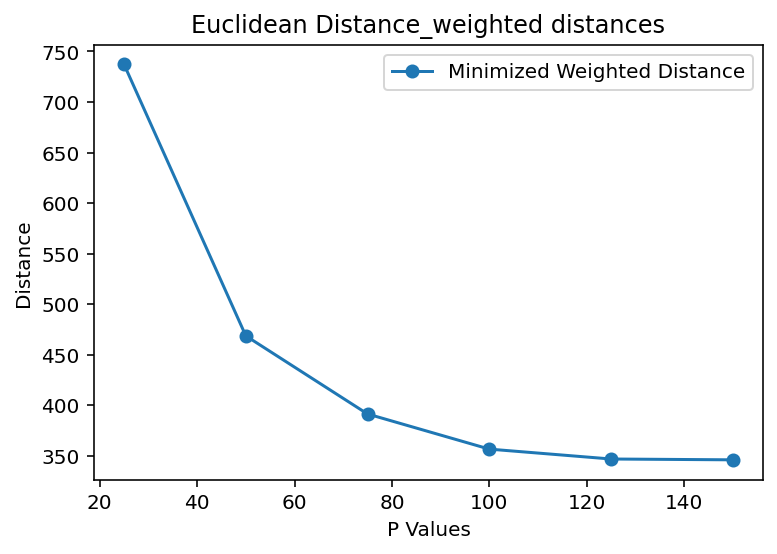

In [73]:
import matplotlib.pyplot as plt

# Data from the table
p_values = [25, 50, 75, 100, 125, 150]
min_weighted_distances = [737.141, 468.637, 391.363, 356.612, 346.825, 346.009]
#mean_distances = [3.722934343434343, 2.366853535353535, 1.976580808080808, 1.8010707070707073, 1.751641414141414, 1.747520202020202]

# Plotting the line graph
plt.plot(p_values, min_weighted_distances, marker='o', label='Minimized Weighted Distance')
#plt.plot(p_values, mean_distances, marker='o', label='Mean Distance per Client')

# Labeling the axes and adding a title
plt.xlabel('P Values')
plt.ylabel('Distance')
plt.title('Euclidean Distance_weighted distances')

# Adding a legend
plt.legend()

# Displaying the plot
plt.show()

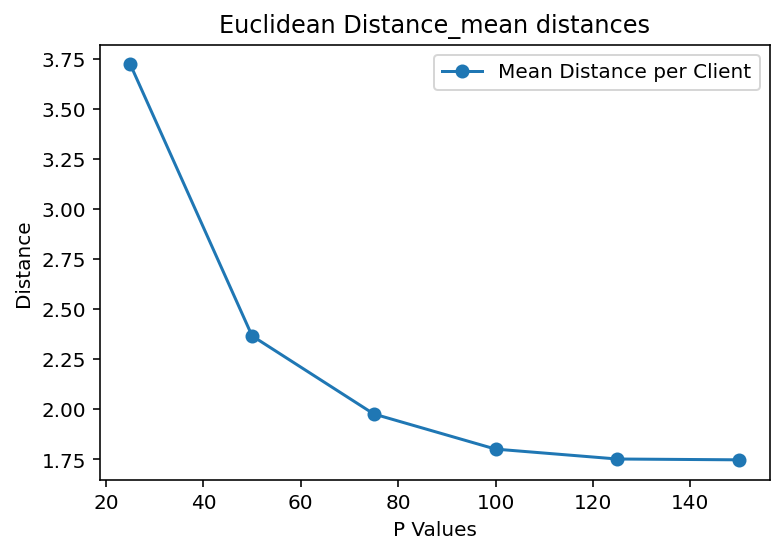

In [74]:
import matplotlib.pyplot as plt

# Data from the table
p_values = [25, 50, 75, 100, 125, 150]
#min_weighted_distances = [737.141, 468.637, 391.363, 356.612, 346.825, 346.009]
mean_distances = [3.722934343434343, 2.366853535353535, 1.976580808080808, 1.8010707070707073, 1.751641414141414, 1.747520202020202]

# Plotting the line graph
#plt.plot(p_values, min_weighted_distances, marker='o', label='Minimized Weighted Distance')
plt.plot(p_values, mean_distances, marker='o', label='Mean Distance per Client')

# Labeling the axes and adding a title
plt.xlabel('P Values')
plt.ylabel('Distance')
plt.title('Euclidean Distance_mean distances')

# Adding a legend
plt.legend()

# Displaying the plot
plt.show()

## Plotting the results

**使用spopt代码生成的图是什么意思？看的不是很懂？为什么不是在实际地图中进行研究，而是需要限定在街道这个框中？**

In [75]:
import seaborn as sns

n_facilities = 294  # Update with the actual number of facility names
palette = sns.color_palette("hsv", n_facilities)

# Convert colors to hexadecimal format
hex_colors = [f"#{int(r*255):02x}{int(g*255):02x}{int(b*255):02x}" for r, g, b in palette]

# Create a dictionary mapping facility names to hexadecimal colors
dv_colors = {f"y{i}": hex_colors[i] for i in range(n_facilities)}

In [76]:
def plot_results(model, p, facs, clis=None, ax=None):
    """Visualize optimal solution sets and context."""
    if not ax:
        multi_plot = False
        fig, ax = plt.subplots(figsize=(6, 6))
        markersize, markersize_factor = 4, 4
    else:
        ax.axis("off")
        multi_plot = True
        markersize, markersize_factor = 2, 2
    ax.set_title(model.name, fontsize=15)

    # extract facility-client relationships for plotting (except for p-dispersion)
    plot_clis = isinstance(clis, geopandas.GeoDataFrame)
    if plot_clis:
        cli_points = {}
    fac_sites = {}
    for i, dv in enumerate(model.fac_vars):
        if dv.varValue:
            dv, predef = facs.loc[i, ["dv", "predefined_loc"]]
            fac_sites[dv] = [i, predef]
            if plot_clis:
                geom = clis.iloc[model.fac2cli[i]]["geometry"]
                cli_points[dv] = geom
    
    # study area and legend entries initialization
    streets.plot(ax=ax, alpha=1, color="black", zorder=1)
    legend_elements = [mlines.Line2D([], [], color="black", label="streets")]
    
    if plot_clis:
        # any clients that not asscociated with a facility
        if model.name.startswith("MCLP"):
            c = "k"
            if model.n_cli_uncov:
                idx = [i for i, v in enumerate(model.cli2fac) if len(v) == 0]
                pnt_kws = dict(ax=ax, fc=c, ec=c, marker="s", markersize=7, zorder=2)
                clis.iloc[idx].plot(**pnt_kws)
            _label = f"Demand sites not covered ($n$={model.n_cli_uncov})"
            _mkws = dict(marker="s", markerfacecolor=c, markeredgecolor=c, linewidth=0)
            legend_elements.append(mlines.Line2D([], [], ms=3, label=_label, **_mkws))

    # all candidate facilities
    facs.plot(ax=ax, fc="brown", marker="*", markersize=80, zorder=8)
    _label = f"Facility sites ($n$={len(model.fac_vars)})"
    _mkws = dict(marker="*", markerfacecolor="brown", markeredgecolor="brown")
    legend_elements.append(mlines.Line2D([], [], ms=7, lw=0, label=_label, **_mkws))
    
    # facility-(client) symbology and legend entries
    zorder = 4
    for fname, (fac, predef) in fac_sites.items():
        cset = dv_colors[fname]
        if plot_clis:
            # clients
            geoms = cli_points[fname]
            gdf = geopandas.GeoDataFrame(geoms)
            gdf.plot(ax=ax, zorder=zorder, ec="k", fc=cset, markersize=100 * markersize)
            _label = f"Demand sites covered by {fname}"
            _mkws = dict(markerfacecolor=cset, markeredgecolor="k", ms=markersize + 7)
            legend_elements.append(
                mlines.Line2D([], [], marker="o", lw=0, label=_label, **_mkws)
            )
        # facilities
        ec = "k"
        lw = 2
        predef_label = "predefined"
        if model.name.endswith(predef_label) and predef:
            ec = "r"
            lw = 3
            fname += f" ({predef_label})"
        facs.iloc[[fac]].plot(
            ax=ax, marker="*", markersize=1000, zorder=9, fc=cset, ec=ec, lw=lw
        )
        _mkws = dict(markerfacecolor=cset, markeredgecolor=ec, markeredgewidth=lw)
        legend_elements.append(
            mlines.Line2D([], [], marker="*", ms=20, lw=0, label=fname, **_mkws)
        )
        # increment zorder up and markersize down for stacked client symbology
        zorder += 1
        if plot_clis:
            markersize -= markersize_factor / p
    
    if not multi_plot:
        # legend
        kws = dict(loc="upper left", bbox_to_anchor=(1.05, 0.7))
        plt.legend(handles=legend_elements, **kws)

### P-Median built from cost matrix (network distance)

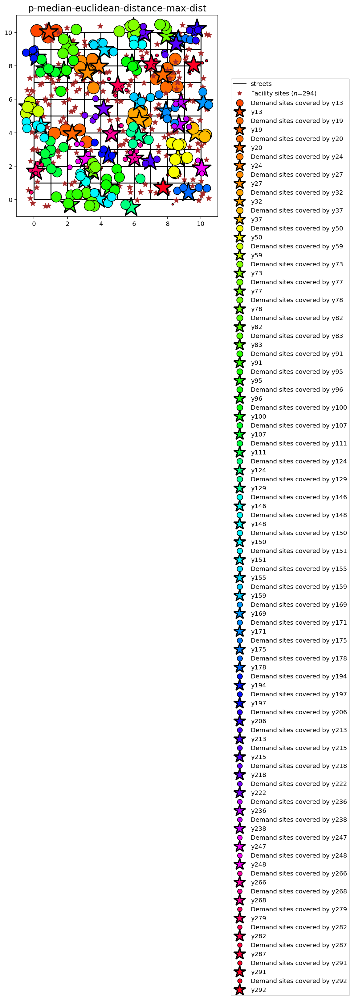

In [77]:
plot_results(pmedian_from_cm, P_FACILITIES, facility_points, clis=client_points)

### P-median built from geodataframes (euclidean distance)

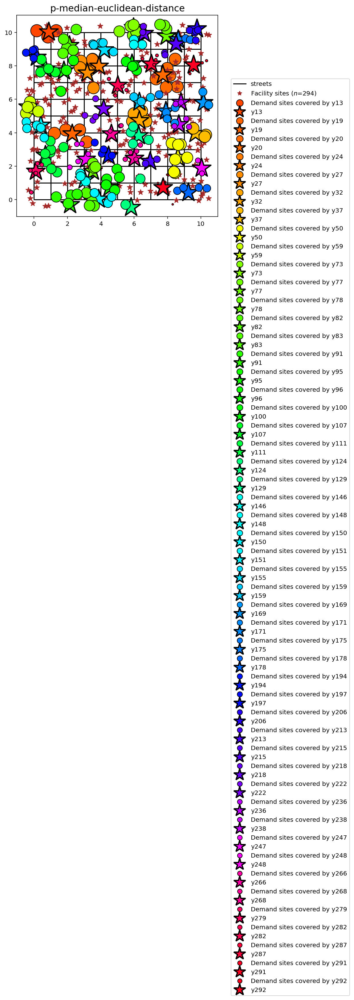

In [78]:
plot_results(pmedian_from_gdf, P_FACILITIES, facility_points, clis=client_points)

### P-median with preselected facilities (euclidean distance)

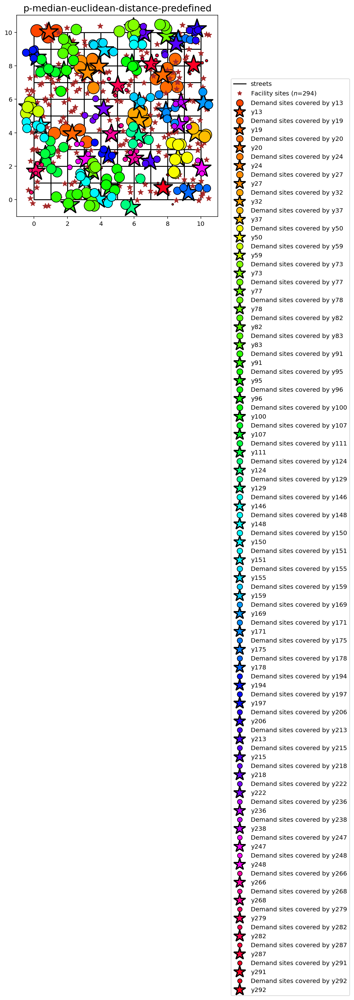

In [79]:
plot_results(pmedian_from_gdf_pre, P_FACILITIES, facility_points, clis=client_points)

### Comparing solution from varied metrics

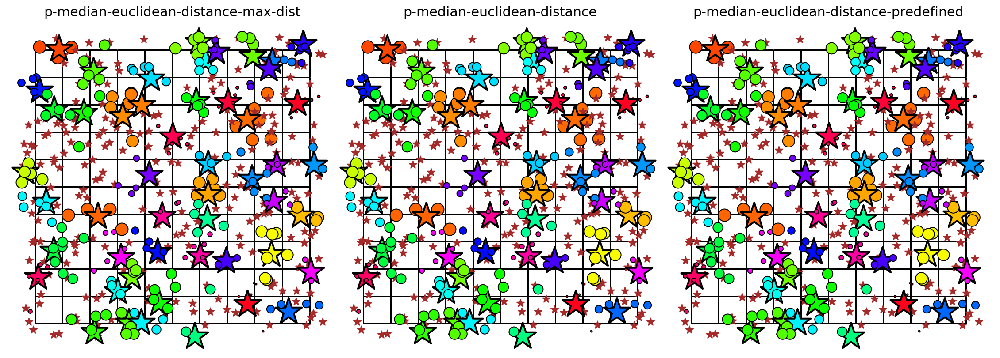

In [80]:
fig, axarr = plt.subplots(1, 3, figsize=(20, 10))
fig.subplots_adjust(wspace=-0.01)
for i, m in enumerate([pmedian_from_cm, pmedian_from_gdf, pmedian_from_gdf_pre]):
    plot_results(m, P_FACILITIES, facility_points, clis=client_points, ax=axarr[i])

# **MCLP (maximum cover location problem)**

In [8]:
pip install -u pandas==1.2.0


Usage:   
  /opt/conda/bin/python -m pip install [options] <requirement specifier> [package-index-options] ...
  /opt/conda/bin/python -m pip install [options] -r <requirements file> [package-index-options] ...
  /opt/conda/bin/python -m pip install [options] [-e] <vcs project url> ...
  /opt/conda/bin/python -m pip install [options] [-e] <local project path> ...
  /opt/conda/bin/python -m pip install [options] <archive url/path> ...

no such option: -u
Note: you may need to restart the kernel to use updated packages.


In [9]:
%config InlineBackend.figure_format = "retina"
%load_ext watermark
%watermark

The watermark extension is already loaded. To reload it, use:
  %reload_ext watermark
Last updated: 2023-05-24T00:25:05.967887+00:00

Python implementation: CPython
Python version       : 3.10.5
IPython version      : 8.4.0

Compiler    : GCC 10.3.0
OS          : Linux
Release     : 5.10.16.3-microsoft-standard-WSL2
Machine     : x86_64
Processor   : x86_64
CPU cores   : 20
Architecture: 64bit



In [10]:
import geopandas
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import matplotlib.lines as mlines
import numpy
import pulp
import shapely
import spopt
from spopt.locate import MCLP, simulated_geo_points

import warnings
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    # ignore deprecation warning - GH pysal/spaghetti#649
    import spaghetti

%watermark -w
%watermark -iv

Watermark: 2.4.2

json      : 2.0.9
ipywidgets: 8.0.2
sys       : 3.10.5 | packaged by conda-forge | (main, Jun 14 2022, 07:04:59) [GCC 10.3.0]
pandas    : 1.4.3
geopandas : 0.11.1
shapely   : 1.8.5
numpy     : 1.23.3
matplotlib: 3.5.2
pulp      : 2.6.0
seaborn   : 0.11.2
spopt     : 0.5.0
spaghetti : 1.6.8



CLIENT_COUNT被设置为事件数据集的长度，代表需求点的数量。<br>
FACILITY_COUNT被设置为潜在基站数据集的长度，代表供应点的数量。<br>
SERVICE_RADIUS被设置为无人机的实际服务半径，代表设施的最大服务半径（以距离为单位）。<br>
P_FACILITIES被设置为50，表示最优解中所期望的候选设施数量。

In [11]:
# quantity demand points
CLIENT_COUNT = len(incident)

# quantity supply points
FACILITY_COUNT = len(potential_station)

# maximum service radius (in distance units)
# 51km*30min
SERVICE_RADIUS = 25.5

# number of candidate facilities in optimal solution
P_FACILITIES = 10

# random seeds for reproducibility
CLIENT_SEED = 5
FACILITY_SEED = 6

# set the solver
solver = pulp.COIN_CMD(msg=False, warmStart=True)

In [12]:
# quantity demand points
CLIENT_COUNT = len(incident)

# quantity supply points
FACILITY_COUNT = len(potential_station)

# Known information
maximum_service_time = 30  # minutes
air_speed = 51  # mph

# Convert air speed to distance units (miles to distance units)
air_speed_distance_units = air_speed * 1.60934 * maximum_service_time / 60  # mph to distance units

# Set the SERVICE_RADIUS based on the maximum distance the drones can travel
SERVICE_RADIUS = air_speed_distance_units

# number of candidate facilities in optimal solution
P_FACILITIES = 10

# random seeds for reproducibility
CLIENT_SEED = 5
FACILITY_SEED = 6

# set the solver
solver = pulp.COIN_CMD(msg=False, warmStart=True)

## Lattice 10x10

下面将创建了一个具有指定边界框和行数和列数的规则格子。然后用 ```spaghetti.Network()``` 将格子转换为网络对象。得到的网络可以用于进一步的分析和操作，比如添加点，计算网络距离，或者进行基于网络的空间分析。

In [13]:
# 这一步涉及到创建一个普通的格子，并使用spaghetti库将其转换为一个网络
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    # ignore deprecation warning - GH pysal/libpysal#468
    lattice = spaghetti.regular_lattice((0, 0, 10, 10), 9, exterior=True)
    # (0, 0, 10, 10)参数定义了格子的边界框，其中前两个值代表最小x和y坐标，后两个值代表最大x和y坐标。
    # 9参数指定了格子的行和列的数量。
    # exterior=True参数表示格子应该包括外部边界，导致格子的边缘沿着边界
ntw = spaghetti.Network(in_data=lattice)

In [14]:
# 将网络对象ntw转换为代表网络中街道或弧线的GeoDataFrame
streets = spaghetti.element_as_gdf(ntw, arcs=True)

In [15]:
# 创建一个名为 streets_buffered 的新 GeoDataFrame
streets_buffered = geopandas.GeoDataFrame(
    # 对 streets GeoDataFrame的 "geometry "列中的每个几何图形进行0.5个单位的缓冲操作，创建一个GeoSeries
    # unary_union将所有被缓冲的几何体合并为一个单一的几何体对
    geopandas.GeoSeries(streets["geometry"].buffer(0.5).unary_union),
    # 将新的GeoDataFrame的坐标参考系统（CRS）设定为与街道GeoDataFrame相同
    crs=streets.crs,
    columns=["geometry"],
)

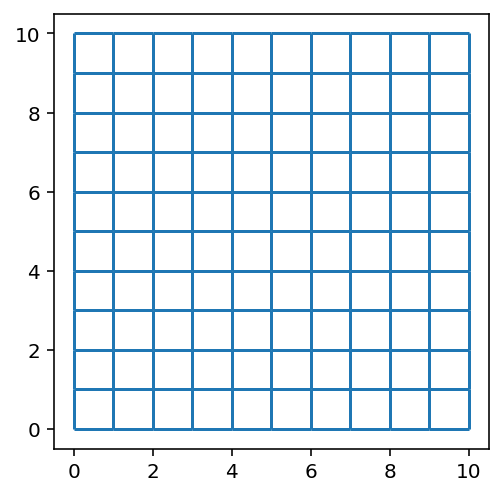

In [16]:
streets.plot();

## Simulate points in a network
使用上面定义的函数，模拟格子边缘附近的点。

In [17]:
# 在缓冲街道的几何形状内生成随机的需求点和站点，代表设施位置问题中需求和设施的潜在位置

# 被用来作为生成点的空间范围，确保了生成的点落在代表研究区域的缓冲街道的几何形状内
client_points = simulated_geo_points(
    streets_buffered, needed=CLIENT_COUNT, seed=CLIENT_SEED
)
facility_points = simulated_geo_points(
    streets_buffered, needed=FACILITY_COUNT, seed=FACILITY_SEED
)

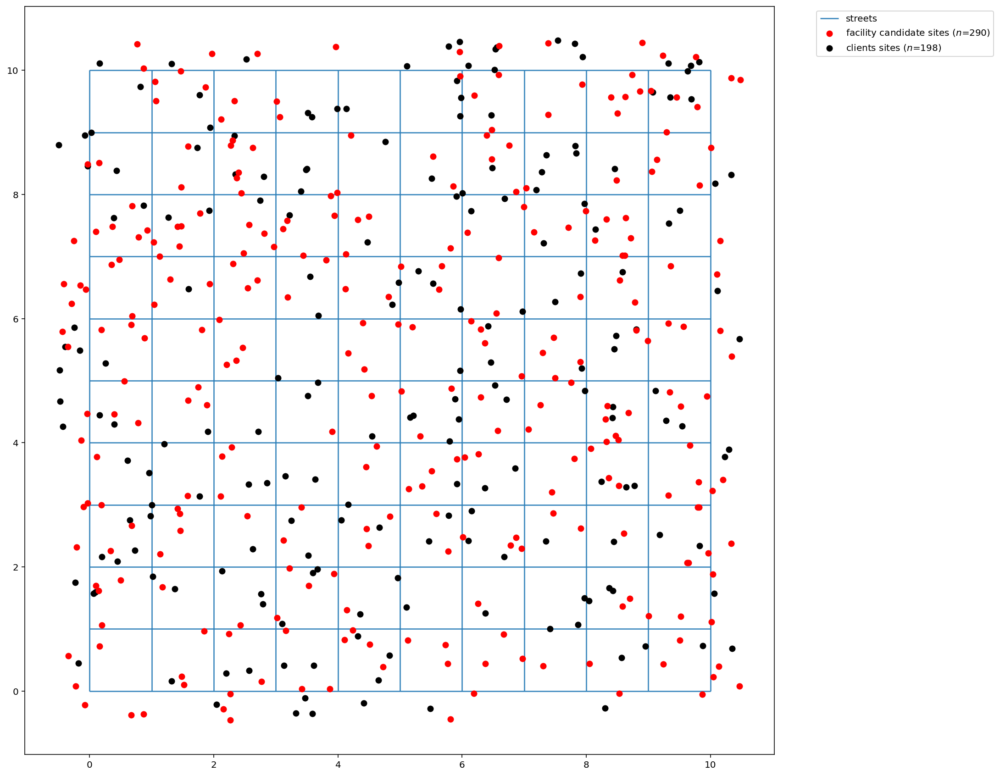

In [18]:
fig, ax = plt.subplots(figsize=(15, 15))
streets.plot(ax=ax, alpha=0.8, zorder=1, label="streets")
facility_points.plot(
    ax=ax, color="red", zorder=2, label=f"facility candidate sites ($n$={FACILITY_COUNT})"
)
client_points.plot(ax=ax, color="black", label=f"clients sites ($n$={CLIENT_COUNT})")
plt.legend(loc="upper left", bbox_to_anchor=(1.05, 1));

**为什么选择1-12的权重范围？这个权重的分配需要遵勖什么原则和信息？**

In [19]:
numpy.random.seed(0)
ai = numpy.random.randint(1, 12, CLIENT_COUNT)
ai

array([ 6,  1,  4,  4,  8, 10,  4,  6,  3,  5,  8,  7,  9,  9, 11,  2,  7,
        8,  8,  9,  2,  6, 10,  9, 10,  5,  4,  1,  4,  6,  1,  3,  4,  9,
        2,  4,  4,  4,  8,  1,  2, 10, 10,  1, 11,  5,  8,  4,  3,  8,  3,
        1,  1,  5,  6,  6,  7,  9,  5,  2,  5, 10, 11, 11,  9,  2,  2,  8,
       10, 10,  4,  7,  8,  3,  1,  4,  6, 10, 11,  5,  5,  7,  5,  5,  4,
        5,  5,  9,  5,  4, 11,  8,  6,  6,  1,  2,  6, 10,  4,  1,  6,  1,
        2,  3,  5,  3,  1,  4,  3, 11,  1,  8,  6, 10,  1, 11,  3, 11,  8,
        3, 10,  3,  4,  4,  3,  4,  5,  2,  3, 10, 11,  2,  5, 11,  7,  9,
        3,  4,  1,  1,  7,  1,  7,  4, 11,  4,  9,  9,  9,  3,  4,  3,  1,
        9,  9,  4,  9, 11,  3,  9,  5,  4,  1,  5,  4,  7, 10,  9,  1,  9,
        6, 10,  1, 10,  7,  6,  4,  2,  9,  1,  5, 10,  7,  6,  8,  9,  9,
       10,  3,  9,  7,  7, 10,  2,  7,  9,  9,  4])

In [20]:
client_points["weights"] = ai
# 计算了DataFrame client_points的 "weights "列中所有数值的总和
client_points["weights"].sum()

1150

下图提供了一个需求点位置的可视化表示，标记的大小表示其相应的权重。

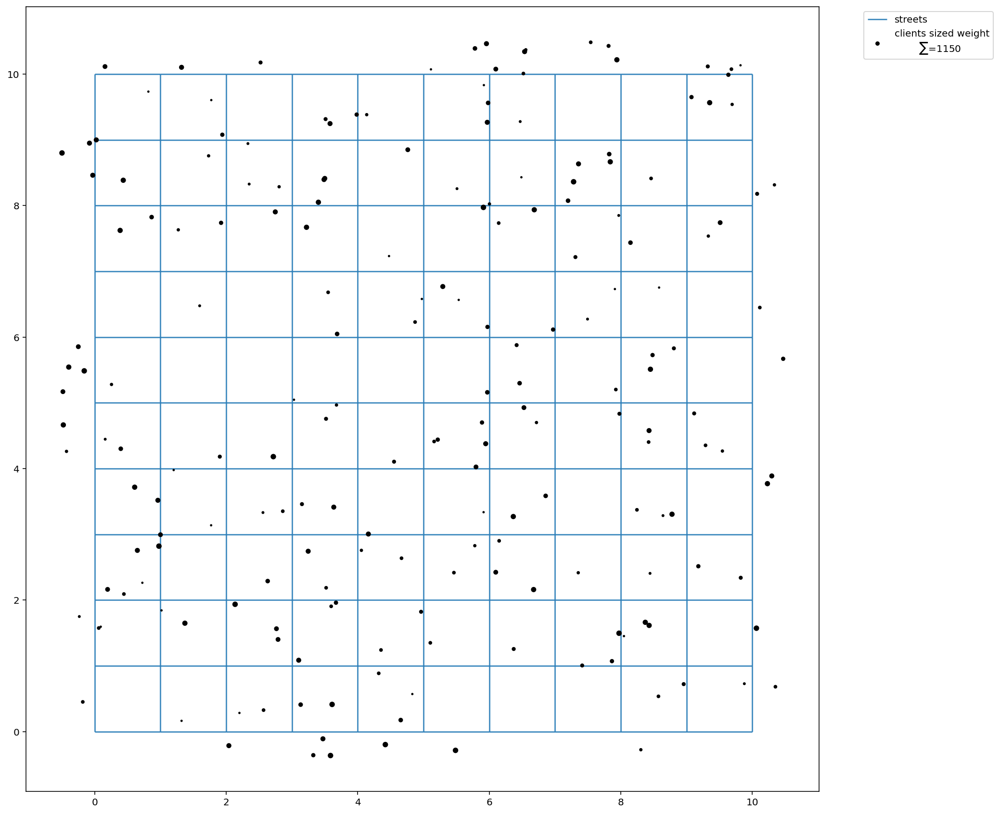

In [21]:
fig, ax = plt.subplots(figsize=(15, 15))
streets.plot(ax=ax, alpha=0.8, zorder=1, label="streets")
client_points.plot(
    ax=ax,
    color="black",
    label=f"clients sized weight\n\t$\sum$={client_points['weights'].sum()}",
    markersize=ai*2
)
plt.legend(loc="upper left", bbox_to_anchor=(1.05, 1));

## Assign simulated points network locations

In [22]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    # ignore deprecation warning - GH pysal/libpysal#468
    ntw.snapobservations(client_points, "clients", attribute=True)
clients_snapped = spaghetti.element_as_gdf(ntw, pp_name="clients", snapped=True)
clients_snapped.drop(columns=["id", "comp_label"], inplace=True)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    # ignore deprecation warning - GH pysal/libpysal#468
    ntw.snapobservations(facility_points, "facilities", attribute=True)
facilities_snapped = spaghetti.element_as_gdf(ntw, pp_name="facilities", snapped=True)
facilities_snapped.drop(columns=["id", "comp_label"], inplace=True)

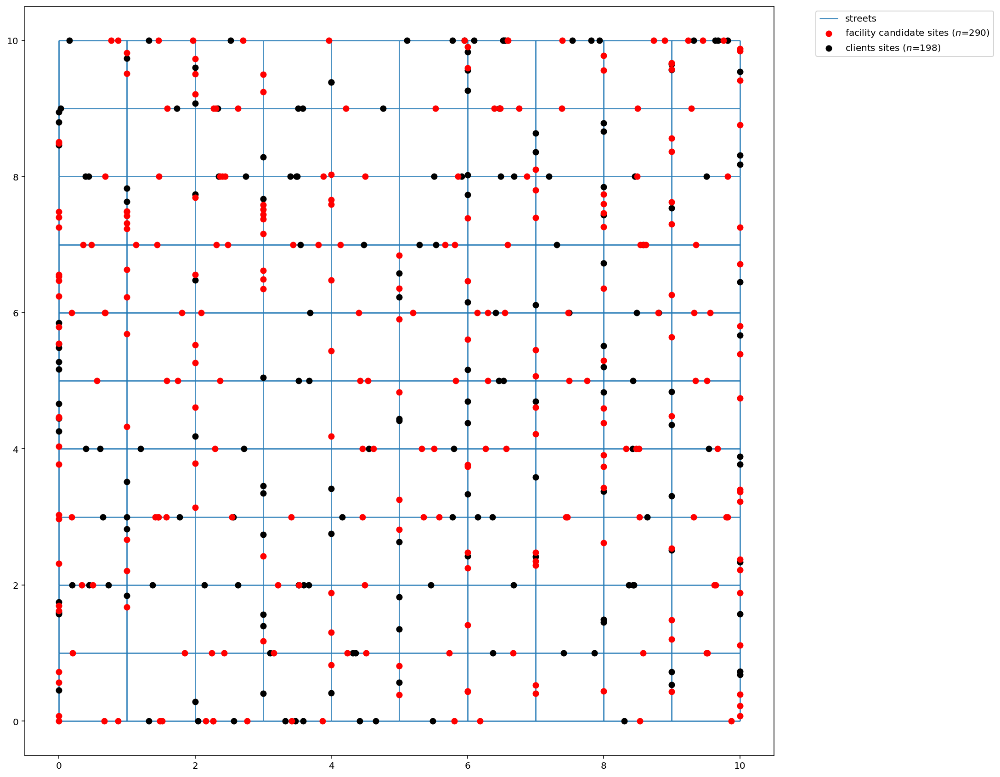

In [23]:
fig, ax = plt.subplots(figsize=(15, 15))
streets.plot(ax=ax, alpha=0.8, zorder=1, label="streets")
facilities_snapped.plot(
    ax=ax, color="red", zorder=2, label=f"facility candidate sites ($n$={FACILITY_COUNT})"
)
clients_snapped.plot(ax=ax, color="black", label=f"clients sites ($n$={CLIENT_COUNT})")
plt.legend(loc="upper left", bbox_to_anchor=(1.05, 1));

## Calculating the (network distance) cost matrix
根据需求点和设施点之间的空间距离计算出成本矩阵。

In [24]:
cost_matrix = ntw.allneighbordistances(
    sourcepattern=ntw.pointpatterns["clients"],
    destpattern=ntw.pointpatterns["facilities"],
)
cost_matrix.shape

(198, 290)

In [25]:
cost_matrix[:5,:]

array([[13.39951703, 15.61157572,  4.39383189, ...,  5.97608145,
         1.45685353,  2.63157224],
       [13.92618165, 16.13824034,  4.92049651, ...,  6.50274607,
         0.93018891,  3.15823686],
       [ 7.55064416,  9.76270285,  4.54495901, ...,  3.87279143,
         7.30572641,  4.32433438],
       [ 3.52405953,  5.73611822,  8.11317865, ...,  3.89937605,
        11.33231103,  8.350919  ],
       [ 7.75652815,  7.09845387,  6.75084301, ..., 10.53704041,
         9.96997538,  6.98858335]])

In [26]:
cost_matrix[-5:,:]

array([[ 0.67949556,  3.82451354, 10.95774263, ...,  6.74394003,
        14.17687501, 11.19548297],
       [ 8.63401404, 10.84607272,  3.00322415, ...,  5.41452629,
         6.22235653,  3.2409645 ],
       [14.78321971, 16.9952784 ,  3.14598153, ...,  7.56373197,
         3.00333305,  2.90824118],
       [ 4.7000136 ,  6.91207229,  6.93722458, ...,  4.72342198,
        10.15635696,  7.17496493],
       [ 9.80197805, 12.01403673,  9.83526014, ...,  2.37854246,
         5.05439252,  8.07300049]])

In [27]:
# Set the constraints
#for i in range(CLIENT_COUNT):
    #mclp_problem += pulp.lpSum(cost_matrix[j][i] * x[j] for j in range(cost_matrix.shape[0])) >= 1

In [28]:
mclp_from_cm = MCLP.from_cost_matrix(
    cost_matrix,
    ai,
    SERVICE_RADIUS,
    p_facilities=P_FACILITIES,
    name="MCLP-network-distance"
)

In [29]:
# mclp_from_cm对象将被更新为结果，它将包含有关最佳设施位置、实现的覆盖率和其他相关属性的信息
mclp_from_cm = mclp_from_cm.solve(solver)
mclp_from_cm

**使用mclp_from_cm.perc_cov获取覆盖率**

In [59]:
print(f"{mclp_from_cm.perc_cov}% coverage is observed")

AttributeError: 'MCLP' object has no attribute 'perc_cov'

**0.5的值通常被用作二元决策变量（例如0或1）的阈值，其中小于0.5的值表示没有选择，大于或等于0.5的值表示有选择。<br>
覆盖率计算检查需求点是否被服务半径内的至少一个选定设施覆盖，大于0.5的变量值被用来识别所选设施。这种方法假定如果任何选定的设施在服务半径内，则需求点被覆盖。**

In [30]:
covered_demand_points = sum(mclp_from_cm.fac_vars[i].varValue > 0.5 for i in range(len(mclp_from_cm.fac_vars)))
coverage_percentage = (covered_demand_points / CLIENT_COUNT) * 100
print(f"{coverage_percentage}% coverage is observed")

5.05050505050505% coverage is observed


In [31]:
import numpy as np
from spopt.locate.coverage import MaxCoverageHeuristic
from spopt.region import SpatialRegion

# Set up the MCLP problem and solve it
mclp_from_cm = MaxCoverageHeuristic(facility_points, demand_points)
mclp_from_cm.solve(p=0.1)

# Get the assigned facilities
assigned_facilities = mclp_from_cm.facility_client_assignment
covered_demand_points = sum(len(clients) for clients in assigned_facilities.values())

# Calculate the coverage percentage
coverage_percentage = (covered_demand_points / CLIENT_COUNT) * 100
print(f"{coverage_percentage}% coverage is observed")

ImportError: cannot import name 'MaxCoverageHeuristic' from 'spopt.locate.coverage' (/opt/conda/lib/python3.10/site-packages/spopt/locate/coverage.py)

In [92]:
print(facility_points)

                     geometry
0     POINT (9.32146 3.15178)
1    POINT (8.53352 -0.04134)
2     POINT (0.68422 6.04557)
3     POINT (5.32799 4.10688)
4     POINT (3.18949 6.34771)
..                        ...
289   POINT (1.44648 7.16638)
290   POINT (2.89393 5.10075)
291   POINT (9.55944 8.05528)
292   POINT (7.73935 0.71924)
293   POINT (9.54551 9.43385)

[294 rows x 1 columns]


In [93]:
print(len(facility_points))

294


In [32]:
import numpy as np
import pulp

# Set up the MCLP problem
mclp_problem = pulp.LpProblem("MCLP", pulp.LpMaximize)

# Define decision variables
x = []
for i in range(len(facility_points)):
    x.append(pulp.LpVariable(f"x_{i}", cat="Binary"))

# Set the objective function
mclp_problem += pulp.lpSum(x)

# Set the constraints
for i in range(len(cost_matrix)):
    mclp_problem += pulp.lpSum(cost_matrix[i][j] * x[j] for j in range(len(facility_points))) >= 1

# Solve the MCLP problem
mclp_problem.solve()

# Get the assigned facilities
assigned_facilities = [facility_points.geometry.iloc[i] for i in range(len(facility_points)) if x[i].varValue > 0.5]

# Calculate the number of covered demand points
covered_demand_points = sum(sum(cost_matrix[i]) > 0 for i in range(len(cost_matrix)) if x[i].varValue > 0.5)

# Calculate the coverage percentage
coverage_percentage = (covered_demand_points / CLIENT_COUNT) * 100
print(f"{coverage_percentage}% coverage is observed")

Welcome to the CBC MILP Solver 
Version: 2.10.8 
Build Date: May  6 2022 

command line - cbc /tmp/62aed935b9144540affd5f8503ec8c54-pulp.mps max timeMode elapsed branch printingOptions all solution /tmp/62aed935b9144540affd5f8503ec8c54-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 203 COLUMNS
At line 58494 RHS
At line 58693 BOUNDS
At line 58984 ENDATA
Problem MODEL has 198 rows, 290 columns and 57420 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 290 - 0.03 seconds
Cgl0004I processed model has 0 rows, 0 columns (0 integer (0 of which binary)) and 0 elements
Cbc3007W No integer variables - nothing to do
Cuts at root node changed objective from -290 to -1.79769e+308
Probing was tried 0 times and created 0 cuts of which 0 were active after adding rounds of cuts (0.000 seconds)
Gomory was tried 0 times and created 0 cuts of which 0 were active after adding rounds of cuts (0.000 s

**上面的代码问题如何解决？如果无法解决，选择下面的方式合适？**<br>
为了计算MCLP中的覆盖率，需要考虑所选设施的需求覆盖率。这通常是根据预定的服务半径来确定的。如果一个需求点在至少一个所选设施的服务半径内，就被认为是被覆盖的。<br>
为了计算覆盖率，要计算至少被一个所选设施覆盖的需求点的数量，然后将其除以需求点的总数量，得出的数值代表覆盖率。
同时考虑了距离标准和设施选择来决定需求点的覆盖率，它确保只有在服务半径内至少有一个选定的设施时，才认为需求点被覆盖。

In [33]:
covered_demand_points = sum(
    # 检查需求点i和设施j之间的距离是否小于或等于服务半径。这个条件确保只有在服务半径内的设施被考虑用于覆盖需求点。
    # 检查设施j是否根据其决策变量值被选中。如果该值大于0.5，表明该设施被选中。
    # 检查服务半径内是否至少有一个设施被选择来覆盖需求点，这是对每个需求点i使用嵌套循环进行的。
    any(cost_matrix[i][j] <= SERVICE_RADIUS and mclp_from_cm.fac_vars[j].varValue > 0.5 for j in range(len(mclp_from_cm.fac_vars)))
    for i in range(len(cost_matrix))
)
# 计算覆盖率，用覆盖的需求点的数量除以需求点的总数
coverage_percentage = (covered_demand_points / CLIENT_COUNT) * 100
print(f"{coverage_percentage}% coverage is observed")

100.0% coverage is observed


In [34]:
covered_demand_points = sum(
    any(cost_matrix[i][j] <= SERVICE_RADIUS and mclp_from_cm.fac_vars[j].varValue is not None and mclp_from_cm.fac_vars[j].varValue > 0.5 for j in range(len(mclp_from_cm.fac_vars)))
    for i in range(len(cost_matrix))
)
coverage_percentage = (covered_demand_points / CLIENT_COUNT) * 100
print(f"{coverage_percentage}% coverage is observed")

100.0% coverage is observed


**为什么当我设置P_FACILITIES = 1是得到的仍是100.0% coverage is observed，这个结果似乎并不合理？**

In [35]:
covered_demand_points = sum(
    any(cost_matrix[i][j] <= SERVICE_RADIUS for j in range(len(mclp_from_cm.fac_vars)))
    for i in range(len(cost_matrix))
)
coverage_percentage = (covered_demand_points / CLIENT_COUNT) * 100
print(f"{coverage_percentage}% coverage is observed")

100.0% coverage is observed


In [36]:
facility_points["dv"] = mclp_from_cm.fac_vars
facility_points["dv"] = facility_points["dv"].map(
    lambda x: x.name.replace("_", "").replace("x", "y")
)
facilities_snapped["dv"] = facility_points["dv"]
facility_points

,geometry,dv
0,POINT (9.32146 3.15178),y0
1,POINT (8.53352 -0.04134),y1
2,POINT (0.68422 6.04557),y2
3,POINT (5.32799 4.10688),y3
4,POINT (3.18949 6.34771),y4
...,...,...
285,POINT (8.58184 1.36749),y285
286,POINT (2.40290 8.35454),y286
287,POINT (7.02996 8.10197),y287
288,POINT (1.46509 9.98749),y288


## Calculating euclidean distance from a GeoDataFrame

In [37]:
distance_metric = "euclidean"
clients_snapped["weights"] = client_points["weights"]
mclp_from_gdf = MCLP.from_geodataframe(
    clients_snapped,
    facilities_snapped,
    "geometry",
    "geometry",
    "weights",
    SERVICE_RADIUS,
    p_facilities=P_FACILITIES,
    distance_metric=distance_metric,
    name=f"MCLP-{distance_metric}-distance"
)

In [38]:
mclp_from_gdf = mclp_from_gdf.solve(solver)
print(f"{mclp_from_gdf.perc_cov}% coverage is observed")

100.0% coverage is observed


In [39]:
covered_demand_points = sum(
    any(cost_matrix[i][j] <= SERVICE_RADIUS and mclp_from_gdf.fac_vars[j].varValue > 0.5 for j in range(len(mclp_from_gdf.fac_vars)))
    for i in range(len(cost_matrix))
)
coverage_percentage = (covered_demand_points / CLIENT_COUNT) * 100
print(f"{coverage_percentage}% coverage is observed")

100.0% coverage is observed


In [40]:
assigned_facilities = [facility_points.geometry.iloc[i] for i in range(len(facility_points)) if mclp_from_cm.fac_vars[i].varValue > 0.5]

# Calculate the number of covered demand points
covered_demand_points = sum(sum(cost_matrix[i]) > 0 for i in range(len(cost_matrix)) if mclp_from_cm.fac_vars[i].varValue > 0.5)

# Calculate the coverage percentage
coverage_percentage = (covered_demand_points / CLIENT_COUNT) * 100
print(f"{coverage_percentage}% coverage is observed")

5.05050505050505% coverage is observed


In [41]:
facility_points["predefined_loc"] = 0
facility_points.loc[(0, 1, 3), "predefined_loc"] = 1
facilities_snapped["predefined_loc"] = facility_points["predefined_loc"]
facility_points

,geometry,dv,predefined_loc
0,POINT (9.32146 3.15178),y0,1
1,POINT (8.53352 -0.04134),y1,1
2,POINT (0.68422 6.04557),y2,0
3,POINT (5.32799 4.10688),y3,1
4,POINT (3.18949 6.34771),y4,0
...,...,...,...
285,POINT (8.58184 1.36749),y285,0
286,POINT (2.40290 8.35454),y286,0
287,POINT (7.02996 8.10197),y287,0
288,POINT (1.46509 9.98749),y288,0


In [42]:
mclp_from_gdf_pre = MCLP.from_geodataframe(
    clients_snapped,
    facilities_snapped,
    "geometry",
    "geometry",
    "weights",
    SERVICE_RADIUS,
    p_facilities=P_FACILITIES,
    predefined_facility_col="predefined_loc",
    distance_metric=distance_metric,
    name=f"MCLP-{distance_metric}-distance-predefined"
)

In [43]:
mclp_from_gdf_pre = mclp_from_gdf_pre.solve(solver)
print(f"{mclp_from_gdf_pre.perc_cov}% coverage is observed")

100.0% coverage is observed


In [44]:
covered_demand_points = sum(
    any(cost_matrix[i][j] <= SERVICE_RADIUS and mclp_from_gdf_pre.fac_vars[j].varValue > 0.5 for j in range(len(mclp_from_gdf_pre.fac_vars)))
    for i in range(len(cost_matrix))
)
coverage_percentage = (covered_demand_points / CLIENT_COUNT) * 100
print(f"{coverage_percentage}% coverage is observed")

100.0% coverage is observed


In [45]:
mclp_from_gdf_pre = mclp_from_gdf_pre.solve(solver)

# Get the assigned facilities
assigned_facilities_predefined = [
    facilities_snapped.geometry.iloc[i] for i in range(len(facilities_snapped)) if mclp_from_gdf_pre.fac_vars[i].varValue > 0.5
]

# Calculate the number of covered demand points
covered_demand_points_predefined = sum(
    sum(cost_matrix[i]) > 0 for i in range(len(cost_matrix)) if mclp_from_gdf_pre.fac_vars[i].varValue > 0.5
)

# Calculate the coverage percentage
coverage_percentage_predefined = (covered_demand_points_predefined / CLIENT_COUNT) * 100
print(f"{coverage_percentage_predefined}% coverage is observed")

5.05050505050505% coverage is observed


## Plotting the results

**为什么使用相同的代码，最后产生的图纸风格差异较大，且需求点的覆盖仅有79个。**

In [46]:
dv_colors_arr = [
    "darkcyan",
    "mediumseagreen",
    "saddlebrown",
    "darkslategray",
    "lightskyblue",
    "thistle",
    "lavender",
    "darkgoldenrod",
    "peachpuff",
    "coral",
    "mediumvioletred",
    "blueviolet",
    "fuchsia",
    "cyan",
    "limegreen",
    "mediumorchid",
]
dv_colors = {f"y{i}": dv_colors_arr[i] for i in range(len(dv_colors_arr))}
dv_colors

{'y0': 'darkcyan',
 'y1': 'mediumseagreen',
 'y2': 'saddlebrown',
 'y3': 'darkslategray',
 'y4': 'lightskyblue',
 'y5': 'thistle',
 'y6': 'lavender',
 'y7': 'darkgoldenrod',
 'y8': 'peachpuff',
 'y9': 'coral',
 'y10': 'mediumvioletred',
 'y11': 'blueviolet',
 'y12': 'fuchsia',
 'y13': 'cyan',
 'y14': 'limegreen',
 'y15': 'mediumorchid'}

In [69]:
import seaborn as sns

n_facilities = 290  # Update with the actual number of facility names
palette = sns.color_palette("hsv", n_facilities)

# Convert colors to hexadecimal format
hex_colors = [f"#{int(r*255):02x}{int(g*255):02x}{int(b*255):02x}" for r, g, b in palette]

# Create a dictionary mapping facility names to hexadecimal colors
dv_colors = {f"y{i}": hex_colors[i] for i in range(n_facilities)}

In [62]:
dv_colors_arr = [
    "darkcyan", "mediumseagreen", "saddlebrown", "darkslategray", "lightskyblue",
    "thistle", "lavender", "darkgoldenrod", "peachpuff", "coral", "mediumvioletred",
    "blueviolet", "fuchsia", "cyan", "limegreen", "mediumorchid"
]

n_facilities = 294  # Update with the actual number of facility names

# Adjust the number of colors to match the number of facilities
color_indices = list(range(len(dv_colors_arr)))
color_indices *= (n_facilities // len(dv_colors_arr)) + 1
selected_colors = [dv_colors_arr[i % len(dv_colors_arr)] for i in color_indices]

# Create a dictionary mapping facility names to colors
dv_colors = {f"y{i}": selected_colors[i] for i in range(n_facilities)}

In [255]:
import seaborn as sns

n_facilities = 294  # Update with the actual number of facility names
palette = sns.color_palette("hsv", n_facilities)

# Adjust the saturation and lightness values to enhance the colors
adjusted_palette = sns.husl_palette(n_colors=n_facilities, s=0.7, l=0.6)

# Convert colors to hexadecimal format
hex_colors = [f"#{int(r*255):02x}{int(g*255):02x}{int(b*255):02x}" for (r, g, b) in adjusted_palette]

# Create a dictionary mapping facility names to hexadecimal colors
dv_colors = {f"y{i}": hex_colors[i] for i in range(n_facilities)}

In [72]:
def plot_results(model, p, facs, clis=None, ax=None):
    """Visualize optimal solution sets and context."""
    if not ax:
        multi_plot = False
        fig, ax = plt.subplots(figsize=(6, 6))
        markersize, markersize_factor = 4, 4
    else:
        ax.axis("off")
        multi_plot = True
        markersize, markersize_factor = 2, 2
    ax.set_title(model.name, fontsize=15)

    # extract facility-client relationships for plotting (except for p-dispersion)
    plot_clis = isinstance(clis, geopandas.GeoDataFrame)
    if plot_clis:
        cli_points = {}
    fac_sites = {}
    for i, dv in enumerate(model.fac_vars):
        if dv.varValue:
            dv, predef = facs.loc[i, ["dv", "predefined_loc"]]
            fac_sites[dv] = [i, predef]
            if plot_clis:
                geom = clis.iloc[model.fac2cli[i]]["geometry"]
                cli_points[dv] = geom

    # study area and legend entries initialization
    streets.plot(ax=ax, alpha=1, color="black", zorder=1)
    legend_elements = [mlines.Line2D([], [], color="black", label="streets")]

    if plot_clis:
        # any clients that not asscociated with a facility
        if model.name.startswith("MCLP"):
            c = "k"
            if model.n_cli_uncov:
                idx = [i for i, v in enumerate(model.cli2fac) if len(v) == 0]
                pnt_kws = dict(ax=ax, fc=c, ec=c, marker="s", markersize=7, zorder=2)
                clis.iloc[idx].plot(**pnt_kws)
            _label = f"Demand sites not covered ($n$={model.n_cli_uncov})"
            _mkws = dict(marker="s", markerfacecolor=c, markeredgecolor=c, linewidth=0)
            legend_elements.append(mlines.Line2D([], [], ms=3, label=_label, **_mkws))

    # all candidate facilities
    facs.plot(ax=ax, fc="brown", marker="*", markersize=80, zorder=8)
    _label = f"Facility sites ($n$={len(model.fac_vars)})"
    _mkws = dict(marker="*", markerfacecolor="brown", markeredgecolor="brown")
    legend_elements.append(mlines.Line2D([], [], ms=7, lw=0, label=_label, **_mkws))

    # facility-(client) symbology and legend entries
    zorder = 4
    for fname, (fac, predef) in fac_sites.items():
        cset = dv_colors[fname]
        if plot_clis:
            # clients
            geoms = cli_points[fname]
            gdf = geopandas.GeoDataFrame(geoms)
            gdf.plot(ax=ax, zorder=zorder, ec="k", fc=cset, markersize=100 * markersize)
            _label = f"Demand sites covered by {fname}"
            _mkws = dict(markerfacecolor=cset, markeredgecolor="k", ms=markersize + 7)
            legend_elements.append(
                mlines.Line2D([], [], marker="o", lw=0, label=_label, **_mkws)
            )
        # facilities
        ec = "k"
        lw = 2
        predef_label = "predefined"
        if model.name.endswith(predef_label) and predef:
            ec = "r"
            lw = 3
            fname += f" ({predef_label})"
        facs.iloc[[fac]].plot(
            ax=ax, marker="*", markersize=1000, zorder=9, fc=cset, ec=ec, lw=lw
        )
        _mkws = dict(markerfacecolor=cset, markeredgecolor=ec, markeredgewidth=lw)
        legend_elements.append(
            mlines.Line2D([], [], marker="*", ms=20, lw=0, label=fname, **_mkws)
        )
        # increment zorder up and markersize down for stacked client symbology
        zorder += 1
        if plot_clis:
            markersize -= markersize_factor / p

    if not multi_plot:
        # legend
        kws = dict(loc="upper left", bbox_to_anchor=(1.05, 0.7))
        plt.legend(handles=legend_elements, **kws)

In [71]:
def plot_results(model, p, facs, clis=None, ax=None):
    if not ax:
        multi_plot = False
        fig, ax = plt.subplots(figsize=(6, 6))
        markersize, markersize_factor = 4, 4
    else:
        ax.axis("off")
        multi_plot = True
        markersize, markersize_factor = 2, 2
    ax.set_title(model.name, fontsize=15)

    plot_clis = isinstance(clis, geopandas.GeoDataFrame)
    if plot_clis:
        cli_points = {}
    fac_sites = {}
    for i, dv in enumerate(model.fac_vars):
        if dv.varValue:
            dv, predef = facs.loc[i, ["dv", "predefined_loc"]]
            fac_sites[dv] = [i, predef]
            if plot_clis:
                geom = clis.iloc[model.fac2cli[i]]["geometry"]
                cli_points[dv] = geom

    streets.plot(ax=ax, alpha=1, color="black", zorder=1)
    legend_elements = [mlines.Line2D([], [], color="black", label="streets")]

    if plot_clis:
        if model.name.startswith("MCLP"):
            c = "k"
            if model.n_cli_uncov:
                idx = [i for i, v in enumerate(model.cli2fac) if len(v) == 0]
                pnt_kws = dict(ax=ax, fc=c, ec=c, marker="s", markersize=7, zorder=2)
                clis.iloc[idx].plot(**pnt_kws)
            _label = f"Demand sites not covered ($n$={model.n_cli_uncov})"
            _mkws = dict(marker="s", markerfacecolor=c, markeredgecolor=c, linewidth=0)
            legend_elements.append(mlines.Line2D([], [], ms=3, label=_label, **_mkws))

    facs.plot(ax=ax, fc="brown", marker="*", markersize=80, zorder=8)
    _label = f"Facility sites ($n$={len(model.fac_vars)})"
    _mkws = dict(marker="*", markerfacecolor="brown", markeredgecolor="brown")
    legend_elements.append(mlines.Line2D([], [], ms=7, lw=0, label=_label, **_mkws))

    zorder = 4
    for fname, (fac, predef) in fac_sites.items():
        cset = dv_colors[fname]
        if plot_clis:
            geoms = cli_points[fname]
            gdf = geopandas.GeoDataFrame(geoms)
            gdf.plot(ax=ax, zorder=zorder, ec="k", fc=cset, markersize=100 * markersize, alpha=0.7)  # Modified: Added alpha
            _label = f"Demand sites covered by {fname}"
            _mkws = dict(markerfacecolor=cset, markeredgecolor="k", ms=markersize + 7)
            legend_elements.append(
                mlines.Line2D([], [], marker="o", lw=0, label=_label, **_mkws)
            )
        ec = "k"
        lw = 2
        predef_label = "predefined"
        if model.name.endswith(predef_label) and predef:
            ec = "r"
            lw = 3
            fname += f" ({predef_label})"
        facs.iloc[[fac]].plot(
            ax=ax, marker="*", markersize=1000, zorder=9, fc=cset, ec=ec, lw=lw
        )
        _mkws = dict(markerfacecolor=cset, markeredgecolor=ec, markeredgewidth=lw)
        legend_elements.append(
            mlines.Line2D([], [], marker="*", ms=20, lw=0, label=fname, **_mkws)
        )
        zorder += 1
        if plot_clis:
            markersize -= markersize_factor / p

    if not multi_plot:
        kws = dict(loc="upper left", bbox_to_anchor=(1.05, 0.7))
        plt.legend(handles=legend_elements, **kws)

## MCLP built from cost matrix (network distance)

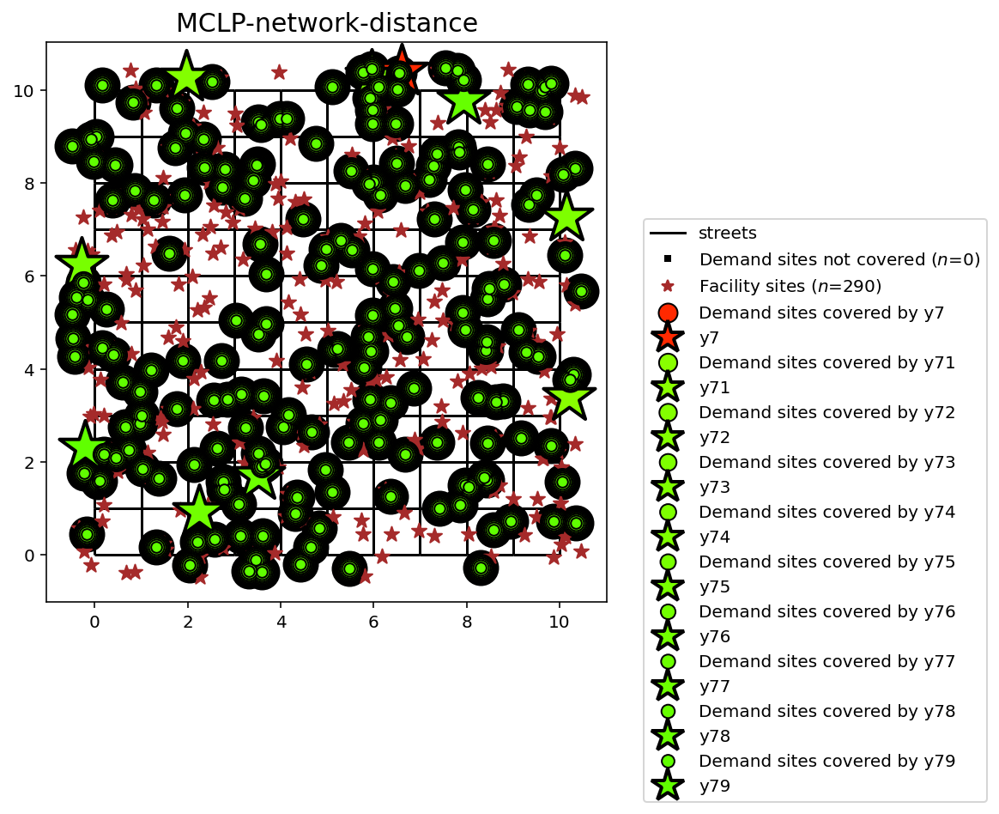

In [73]:
plot_results(mclp_from_cm, P_FACILITIES, facility_points, clis=client_points)

## MCLP built from geodataframes (euclidean distance)

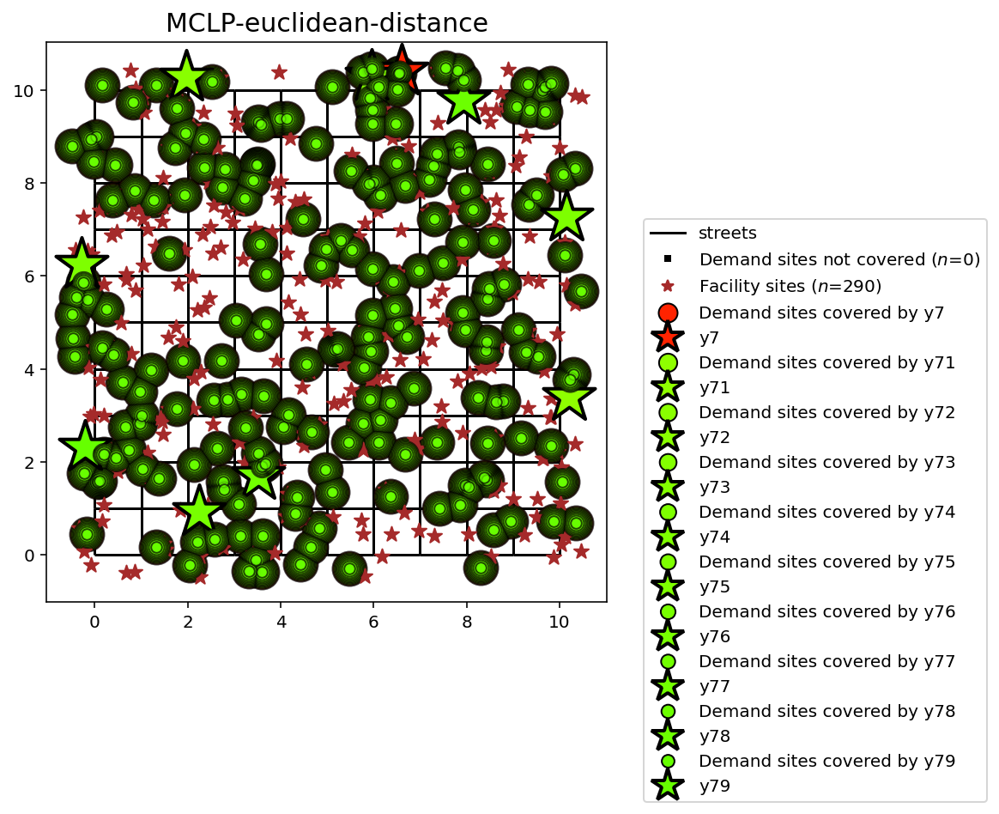

In [53]:
plot_results(mclp_from_gdf, P_FACILITIES, facility_points, clis=client_points)

## MCLP with preselected facilities (euclidean distance)

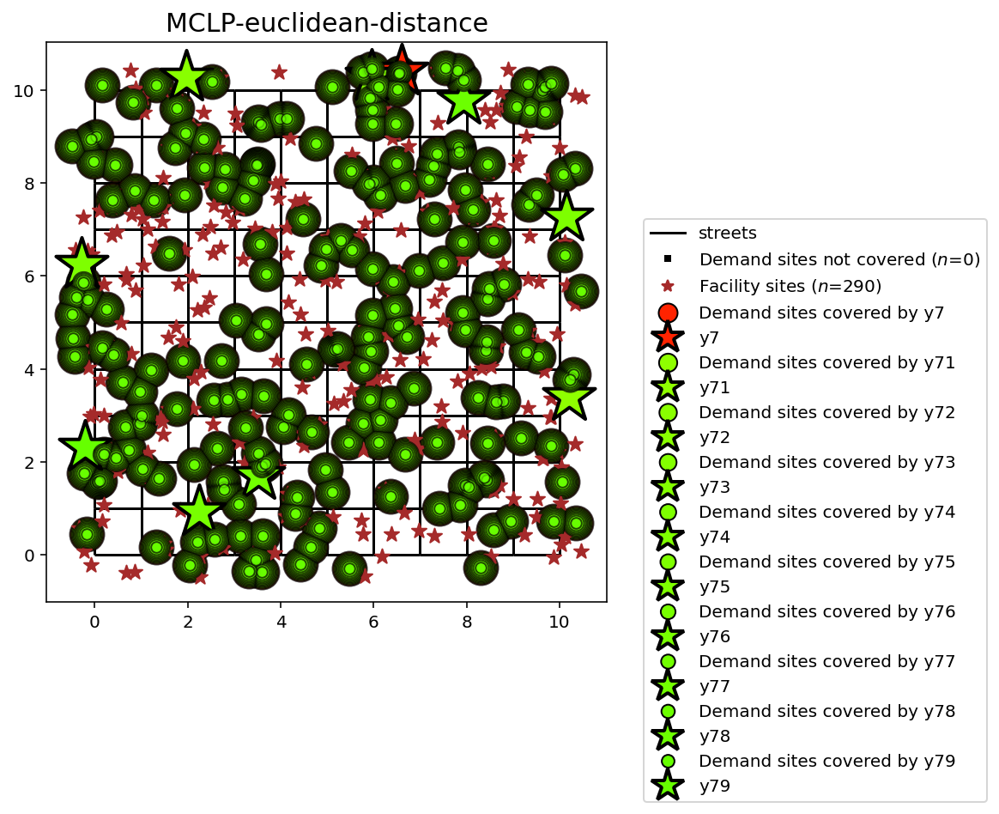

In [54]:
plot_results(mclp_from_gdf, P_FACILITIES, facility_points, clis=client_points)

## MCLP with preselected facilities (euclidean distance)

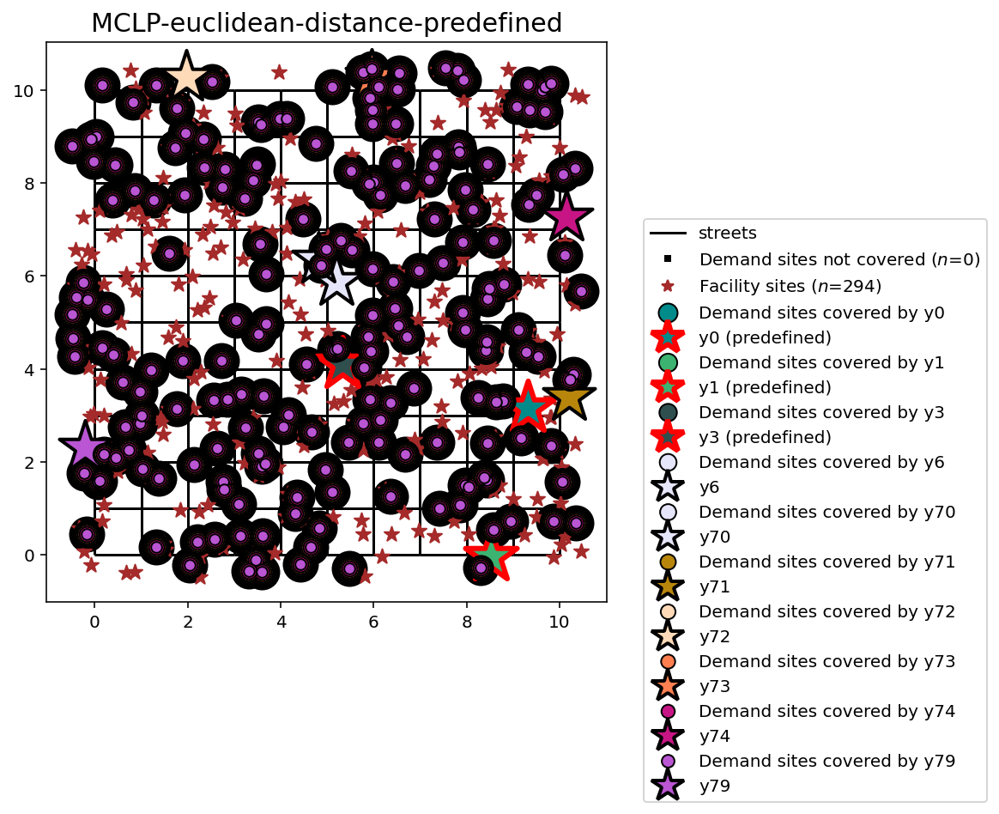

In [306]:
plot_results(mclp_from_gdf_pre, P_FACILITIES, facility_points, clis=client_points)

## Comparing solution from varied metrics

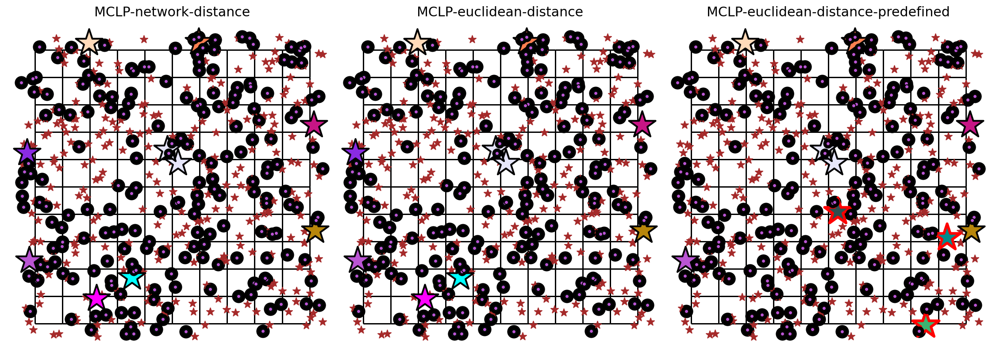

In [307]:
fig, axarr = plt.subplots(1, 3, figsize=(20, 10))
fig.subplots_adjust(wspace=-0.01)
for i, m in enumerate([mclp_from_cm, mclp_from_gdf, mclp_from_gdf_pre]):
    plot_results(m, P_FACILITIES, facility_points, clis=client_points, ax=axarr[i])